In [1]:
import xarray as xr
import cartopy
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from pathlib import Path
from matplotlib.colors import ListedColormap, BoundaryNorm
import cmocean
from matplotlib import cm
import cartopy.feature as cfeature
import matplotlib.ticker as ticker
import cartopy.crs as ccrs
from matplotlib.colors import to_hex


### Open files

In [2]:
file_path = Path("/gxfs_work/geomar/smomw400/git_projects/2022_north-sea_oysters/output_data/040_connectivity_analysis_05m/")

In [ ]:
ds_conn_07 = xr.open_dataset(str(file_path / "040_connectivity_analysis_05m_00-07days.nc"))

In [ ]:
ds_conn_14 = xr.open_dataset(str(file_path / "040_connectivity_analysis_05m_07-14days.nc"))

In [ ]:
ds_conn_28 = xr.open_dataset(str(file_path / "040_connectivity_analysis_05m_07-28days.nc"))

In [ ]:
hex_to_rst_name = pd.read_csv(
    "/gxfs_work/geomar/smomw400/git_projects/2022_north-sea_oysters/data/config/hex_to_restoration_site.csv",
    index_col=0
)

In [ ]:
hex_to_rst_name = hex_to_rst_name.iloc[:, 0]

### Normalization

In [8]:
ds_conn_07["obs_per_origin_area"] = ds_conn_07.obs / ds_conn_07.water_fraction_hex0

In [9]:
ds_conn_14["obs_per_origin_area"] = ds_conn_14.obs / ds_conn_14.water_fraction_hex0

In [10]:
ds_conn_28["obs_per_origin_area"] = ds_conn_28.obs / ds_conn_28.water_fraction_hex0

### Labellig habitable zones
- depth < 85m, rest sites, aquaculture, historic sites, known disease sites, known healthy sites

In [ ]:
ds_conn_07["habitable_hex0"] = (
    (ds_conn_07.depth_median_hex0 < 85)
    | (ds_conn_07.his_count_hex0 > 0)
    | (ds_conn_07.rst_count_hex0 > 0)
    | (ds_conn_07.aqc_count_hex0 > 0)
    | (ds_conn_07.dss_count_hex0 > 0)
    | (ds_conn_07.hly_count_hex0 > 0)
).rename("habitable_hex0")

ds_conn_07["habitable_hex1"] = (
    (ds_conn_07.depth_median_hex1 < 85)
    | (ds_conn_07.rst_count_hex1 > 0)
    | (ds_conn_07.his_count_hex1 > 0)
    | (ds_conn_07.aqc_count_hex1 > 0)
    | (ds_conn_07.dss_count_hex1 > 0)
    | (ds_conn_07.hly_count_hex1 > 0)
).rename("habitable_hex1")

In [ ]:
ds_conn_14["habitable_hex0"] = (
    (ds_conn_14.depth_median_hex0 < 85)
    | (ds_conn_14.his_count_hex0 > 0)
    | (ds_conn_14.rst_count_hex0 > 0)
    | (ds_conn_14.aqc_count_hex0 > 0)
    | (ds_conn_14.dss_count_hex0 > 0)
    | (ds_conn_14.hly_count_hex0 > 0)
).rename("habitable_hex0")

ds_conn_14["habitable_hex1"] = (
    (ds_conn_14.depth_median_hex1 < 85)
    | (ds_conn_14.rst_count_hex1 > 0)
    | (ds_conn_14.his_count_hex1 > 0)
    | (ds_conn_14.aqc_count_hex1 > 0)
    | (ds_conn_14.dss_count_hex1 > 0)
    | (ds_conn_14.hly_count_hex1 > 0)
).rename("habitable_hex1")

In [ ]:
ds_conn_28["habitable_hex0"] = (
    (ds_conn_28.depth_median_hex0 < 85)
    | (ds_conn_28.his_count_hex0 > 0)
    | (ds_conn_28.rst_count_hex0 > 0)
    | (ds_conn_28.aqc_count_hex0 > 0)
    | (ds_conn_28.dss_count_hex0 > 0)
    | (ds_conn_28.hly_count_hex0 > 0)
).rename("habitable_hex0")

ds_conn_28["habitable_hex1"] = (
    (ds_conn_28.depth_median_hex1 < 85)
    | (ds_conn_28.rst_count_hex1 > 0)
    | (ds_conn_28.his_count_hex1 > 0)
    | (ds_conn_28.aqc_count_hex1 > 0)
    | (ds_conn_28.dss_count_hex1 > 0)
    | (ds_conn_28.hly_count_hex1 > 0)
).rename("habitable_hex1")

In [14]:
habitable_to_habitable_01y_07 = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.habitable_hex0 > 0)
    & (ds_conn_07.habitable_hex1 > 0)
)

In [15]:
habitable_to_habitable_01y_14 = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.habitable_hex0 > 0)
    & (ds_conn_14.habitable_hex1 > 0)
)

In [16]:
habitable_to_habitable_01y_28 = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.habitable_hex0 > 0)
    & (ds_conn_28.habitable_hex1 > 0)
)

## Automated

In [19]:
def plot_rst_maps_all_timespans(ds_list, timesteps_list, titles, cmap_colors, levels, fontsize = 12, figsize=(15,6)):
    """
    Plot restoration site arrival fractions for three timespans side by side with shared colorbar.
    """
    cmap = ListedColormap(cmap_colors)
    norm = BoundaryNorm(levels, cmap.N)

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.03], wspace=0.05)

    axes = [fig.add_subplot(gs[0, i], projection=ccrs.Mercator()) for i in range(3)]
    scatter_artist = None

    for i, (ds_conn, ts, ax, title) in enumerate(zip(ds_list, timesteps_list, axes, titles)):
        dss_to_rst = ds_conn.obs_per_origin_area.where(
            (ds_conn.dss_count_hex0 > 0).compute(), drop=True
        ).where(ds_conn.rst_count_hex1 > 0)

        arrivals_per_hex1 = dss_to_rst.sum(dim=["hex0", "year", "month"])
        total_released = ds_conn.obs_per_origin_area.where((ds_conn.dss_count_hex0 > 0), drop=True).sum().item()
        fraction_arrived = arrivals_per_hex1 / (total_released * ts)

        rst_sites = ds_conn.rst_count_hex1.where(ds_conn.rst_count_hex1 > 0).to_dataset().to_pandas().dropna()
        rst_hex1s = rst_sites.index.get_level_values('hex1').unique().astype(ds_conn.hex1.dtype)

        df = fraction_arrived.to_dataset(name="fraction_arrived").to_pandas()
        df = df[df.index.get_level_values('hex1').isin(rst_hex1s)]

        zero_risk = df[df["fraction_arrived"] == 0]
        nonzero_risk = df[df["fraction_arrived"] > 0].copy()

        ax.scatter(
            zero_risk["lon_hex1"], zero_risk["lat_hex1"],
            c="#ffffff", s=70, edgecolor='black', linewidth=0.5,
            transform=ccrs.PlateCarree(), zorder=2
        )
        sc = ax.scatter(
            nonzero_risk["lon_hex1"], nonzero_risk["lat_hex1"],
            c=np.log10(nonzero_risk["fraction_arrived"]),
            cmap=cmap, norm=norm, s=70, edgecolor='black', linewidth=0.5,
            transform=ccrs.PlateCarree(), zorder=3
        )

        ax.coastlines(zorder=0)
        ax.set_extent([-11.2, 10, 46, 62.5])
        ax.add_feature(cfeature.LAND, facecolor='#e6e6e6', zorder=-1)

        gl = ax.gridlines(draw_labels=True, alpha=0.2)
        gl.xlocator = ticker.MultipleLocator(3)
        gl.ylocator = ticker.MultipleLocator(3)
        gl.xlabel_style = {'size': fontsize}
        gl.ylabel_style = {'size': fontsize}
        gl.top_labels = False
        gl.right_labels = False

        if i == 0:
        # Show y-axis labels only on leftmost subplot
            gl.left_labels = True
            gl.bottom_labels = True
        else:
        # No y-axis labels on others
            gl.left_labels = False
            gl.bottom_labels = True

    # To be safe, remove matplotlib y ticks on all plots except leftmost
        if i != 0:
            ax.set_yticks([])
            ax.set_yticklabels([])
            ax.yaxis.set_ticks_position('none')
            ax.tick_params(axis='y', which='both', length=0, labelleft=False)
        else:
        # On leftmost, if you want, you can customize the y-axis ticks or labels here
            pass

        ax.set_title(title, fontsize=fontsize)

        # Remove y-axis ticks and labels completely
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.yaxis.set_ticks_position('none')
        ax.tick_params(axis='y', which='both', length=0, labelleft=False, labelsize=fontsize)

        scatter_artist = sc  # save for colorbar

    # Colorbar: position and style exactly like the heatmap plot
    cbar_ax = fig.add_axes([0.88, 0.25, 0.015, 0.5])  # x, y, width, height
    cbar = fig.colorbar(scatter_artist, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=fontsize)
    cbar.set_ticks(levels)
    cbar.set_ticklabels(['0', '1e-8', '1e-7', '1e-6', '1e-5', '1e-4', '1e-3'])
    cbar.set_label('Relative concentration (log10)', fontsize=fontsize)

    fig.subplots_adjust(left=0.22, right=0.86, wspace=0.05)
    fig.tight_layout()
    #fig.suptitle("Fraction of released particles arriving at restoration sites (DSS to restoration, log10)", fontsize=18)

    plt.show()


/tmp/ipykernel_684339/3050488274.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


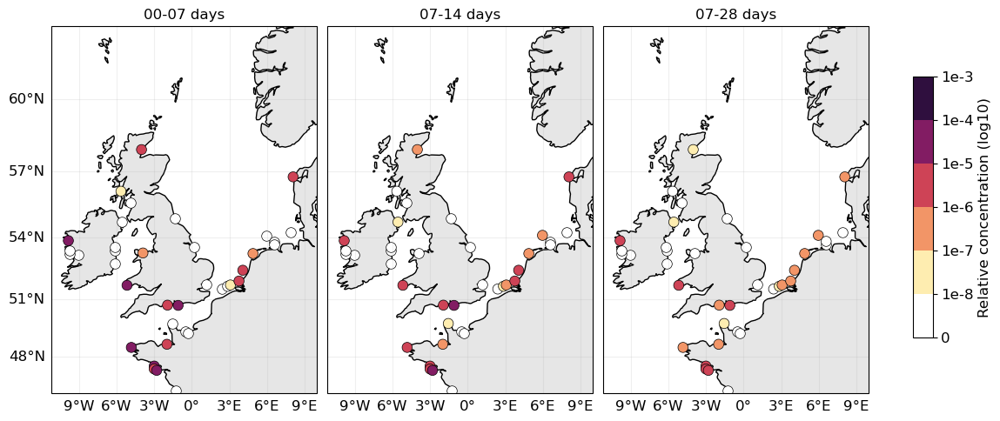

In [20]:
ds_list = [ds_conn_07, ds_conn_14, ds_conn_28]
timesteps_list = [168, 168, 504]
titles = ["00-07 days", "07-14 days", "07-28 days"]
levels = [-9, -8, -7, -6, -5, -4, -3]
fontsize = 12
colors = ['#ffffff', '#feedb0', '#f29567', '#ce4356', '#821c63', '#2f0f3e']

plot_rst_maps_all_timespans(ds_list, timesteps_list, titles, colors, levels, fontsize)

In [11]:

amp_colors = [cmocean.cm.matter(x) for x in np.linspace(0, 1, 5)]
amp_hex_colors = [to_hex(c) for c in amp_colors]
print(amp_hex_colors)

['#feedb0', '#f29567', '#ce4356', '#821c63', '#2f0f3e']


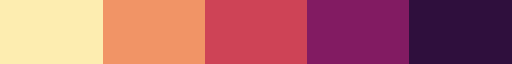

In [7]:
amp_colors = [cmocean.cm.matter(x) for x in np.linspace(0, 1, 5)]
cmap = ListedColormap(amp_colors)
cmap

### Variability

/opt/conda/envs/parcels/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/conda/envs/parcels/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/conda/envs/parcels/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


YTick count: 45
First 5 YTick labels: ['DEEP Dornoch', 'BioReef Thyboron', 'Kilchoan Melfort', 'Seawilding Craighnish', 'Wild Oysters Clyde']


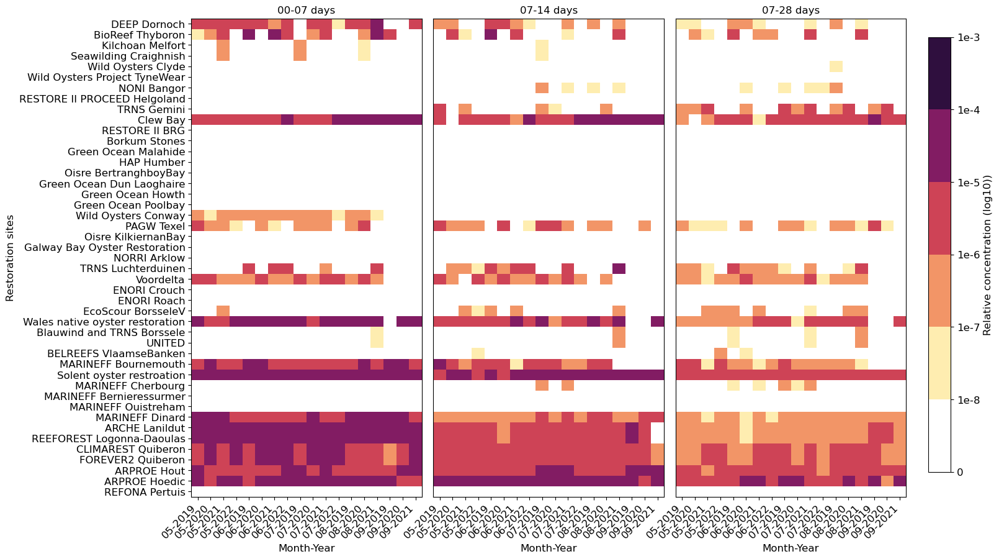

In [19]:
# ...existing code...
fontsize = 12
def make_rst_heatmap(ds_conn, timesteps, hex_to_rst_name, y_index=None):
    # 1. Subset: only DSS to restoration site connections
    dss_to_rst = ds_conn.obs_per_origin_area.where(
        (ds_conn.dss_count_hex0 > 0).compute(),
        drop=True,
    ).where(
        (ds_conn.rst_count_hex1 > 0)
    )

    # 2. Sum arrivals per site, month, year
    arrivals_per_hex1_my = dss_to_rst.sum(dim="hex0")  # (hex1, month, year)

    # 3. Total number of particles released per month/year
    released_particles_my = ds_conn.obs_per_origin_area.where(
        (ds_conn.dss_count_hex0 > 0), drop=True
    ).sum(dim="hex0").to_dataframe().groupby(['month', 'year']).sum().reset_index()
    released_particles_my = released_particles_my.rename(columns={'obs_per_origin_area': 'released_particles'})

    # 4. Convert arrivals to DataFrame
    arrivals_df = arrivals_per_hex1_my.to_dataframe(name="arrived_particles").reset_index()

    # 5. Merge to get released_particles for each month/year
    arrivals_df = arrivals_df.merge(released_particles_my, on=['month', 'year'], how='left')

    # 6. Calculate fraction arrived per site, month, year
    arrivals_df["fraction_arrived"] = arrivals_df["arrived_particles"] / (arrivals_df["released_particles"] * timesteps)

    # 7. Take log10 (set to NaN for zero)
    arrivals_df["log10_fraction"] = np.where(
        arrivals_df["fraction_arrived"] > 0,
        np.log10(arrivals_df["fraction_arrived"]),
        np.nan
    )

    # 8. Map month/year to string labels
    month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
    year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}
    arrivals_df['month'] = arrivals_df['month'].map(month_mapping)
    arrivals_df['year'] = arrivals_df['year'].map(year_mapping)
    arrivals_df["month_year"] = arrivals_df["month"] + "-" + arrivals_df["year"]

    # 9. Pivot for heatmap
    heatmap_data_log = arrivals_df.pivot_table(
        index='hex1',
        columns='month_year',
        values='log10_fraction',
        aggfunc='first'
    )
    # 10. Prepare restoration site labels and sort by latitude
    rst_sites = ds_conn.rst_count_hex1.where(ds_conn.rst_count_hex1 > 0).to_dataset().to_pandas().dropna()
    rst_hex1s = rst_sites.index.get_level_values('hex1').unique()
    hex1_to_lat = rst_sites['lat_hex1']
    heatmap_data_log = heatmap_data_log.reindex(rst_hex1s)
    if y_index is None:
        # Sort from north to south (descending latitude)
        sorted_by_lat = hex1_to_lat.loc[heatmap_data_log.index].sort_values(ascending=False).index
    else:
        sorted_by_lat = y_index
    heatmap_data_log = heatmap_data_log.loc[sorted_by_lat]

    site_df = pd.DataFrame({
        'hex1': heatmap_data_log.index,
        # Replace underscores with spaces in resto_label
        'resto_label': [
            hex_to_rst_name.loc[str(h)].replace('_', ' ') if str(h) in hex_to_rst_name.index else str(h)
            for h in heatmap_data_log.index
        ]
    })
    site_df = site_df.set_index('hex1').loc[sorted_by_lat].reset_index()
    
    # Expand rows where resto_label contains ';'
    expanded_rows = []
    for idx, row in site_df.iterrows():
        names = [n.strip() for n in str(row['resto_label']).split(';')]
        for name in names:
            # Remove underscores in split names as well
            expanded_rows.append({'hex1': row['hex1'], 'resto_label': name.replace('_', ' ')})

    ordered_expanded_index = [(row['hex1'], row['resto_label']) for row in expanded_rows]

    expanded_heatmap = pd.DataFrame(
        index=pd.MultiIndex.from_tuples(ordered_expanded_index, names=['hex1', 'resto_label']),
        columns=heatmap_data_log.columns,
        dtype=heatmap_data_log.values.dtype
    )
    for h, label in ordered_expanded_index:
        expanded_heatmap.loc[(h, label)] = heatmap_data_log.loc[h].values

    # --- Add "no connections" category ---
    expanded_heatmap_filled = expanded_heatmap.copy()
    expanded_heatmap_filled = expanded_heatmap_filled.fillna(-9)  # -9 = "no connection" category

    return expanded_heatmap_filled, [label for _, label in expanded_heatmap_filled.index]

# --- Plot all three time spans side by side ---
timesteps_list = [168, 168, 504]
ds_list = [ds_conn_07, ds_conn_14, ds_conn_28]
titles = ["00-07 days", "07-14 days", "07-28 days"]

# Use the same y-axis order for all plots
heatmap_07, ylabels = make_rst_heatmap(ds_conn_07, 168, hex_to_rst_name)
heatmap_14, _ = make_rst_heatmap(ds_conn_14, 168, hex_to_rst_name, y_index=heatmap_07.index.get_level_values(0).unique())
heatmap_28, _ = make_rst_heatmap(ds_conn_28, 504, hex_to_rst_name, y_index=heatmap_07.index.get_level_values(0).unique())

resto_labels = heatmap_07.index.get_level_values(1)

levels = [-9, -8, -7, -6, -5, -4, -3]
labels = ['0', '1e-8', '1e-7', '1e-6', '1e-5', '1e-4', '1e-3']
colors = ['#ffffff', '#feedb0', '#f29567', '#ce4356', '#821c63', '#2f0f3e']
cmap = ListedColormap(colors)
norm = BoundaryNorm(levels, cmap.N)

fig, axes = plt.subplots(1, 3, figsize=(18, 10), sharey=False)
for i, (heatmap, ax, title) in enumerate(zip([heatmap_07, heatmap_14, heatmap_28], axes, titles)):
    im = ax.imshow(
        heatmap.values,
        aspect='auto',
        cmap=cmap,
        norm=norm
    )
    ax.set_xticks(np.arange(len(heatmap.columns)))
    ax.set_xticklabels(heatmap.columns, rotation=45, ha='right', fontsize=fontsize)
    if i == 0:
        ax.set_yticks(np.arange(heatmap.shape[0]))
        ax.set_yticklabels([label for _, label in heatmap.index], fontsize=fontsize)
        ax.set_ylabel('Restoration sites', fontsize=fontsize)
        print("YTick count:", len(ax.get_yticklabels()))
        print("First 5 YTick labels:", [tick.get_text() for tick in ax.get_yticklabels()[:5]])
    else:
        ax.set_yticks([])
        ax.set_yticklabels([])
    ax.set_xlabel('Month-Year', fontsize=fontsize)
    ax.set_title(title, fontsize=fontsize)

fig.subplots_adjust(left=0.22, right=0.86, wspace=0.05)
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.ax.tick_params(labelsize=fontsize)
cbar.set_ticks(levels)
cbar.set_ticklabels(labels)
cbar.set_label('Relative concentration (log10))', fontsize=fontsize)

#plt.suptitle("Fraction of released particles arriving at restoration sites (per month & year)", fontsize=18)
#plt.subplots_adjust(left=0.35)
plt.show()


## Old

/opt/conda/envs/parcels/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


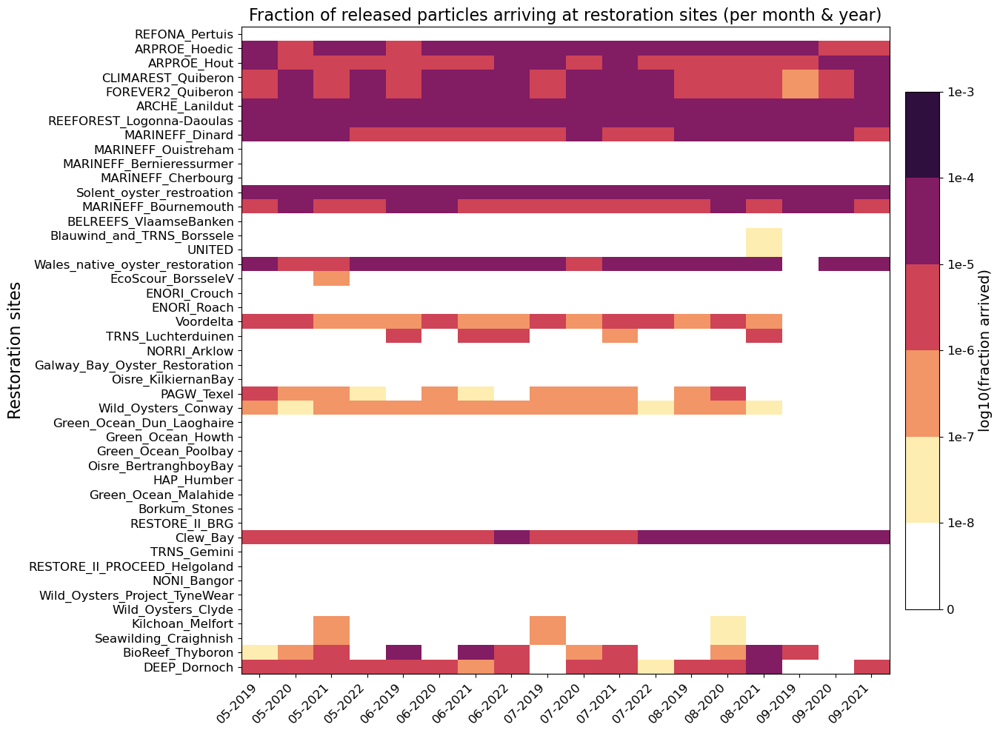

In [ ]:
# ...existing code...

# 1. Subset: only DSS to restoration site connections
dss_to_rst = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0).compute(),
    drop=True,
).where(
    (ds_conn_07.rst_count_hex1 > 0)
)

# 2. Sum arrivals per site, month, year
arrivals_per_hex1_my = dss_to_rst.sum(dim="hex0")  # (hex1, month, year)

# 3. Total number of particles released per month/year
released_particles_my = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0), drop=True
).sum(dim="hex0").to_dataframe().groupby(['month', 'year']).sum().reset_index()
released_particles_my = released_particles_my.rename(columns={'obs_per_origin_area': 'released_particles'})

# 4. Convert arrivals to DataFrame
arrivals_df = arrivals_per_hex1_my.to_dataframe(name="arrived_particles").reset_index()

# 5. Merge to get released_particles for each month/year
arrivals_df = arrivals_df.merge(released_particles_my, on=['month', 'year'], how='left')

# 6. Calculate fraction arrived per site, month, year
timesteps = 168  # or 504 for 07-28days
arrivals_df["fraction_arrived"] = arrivals_df["arrived_particles"] / (arrivals_df["released_particles"] * timesteps)

# 7. Take log10 (set to NaN for zero)
arrivals_df["log10_fraction"] = np.where(
    arrivals_df["fraction_arrived"] > 0,
    np.log10(arrivals_df["fraction_arrived"]),
    np.nan
)

# 8. Map month/year to string labels
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}
arrivals_df['month'] = arrivals_df['month'].map(month_mapping)
arrivals_df['year'] = arrivals_df['year'].map(year_mapping)
arrivals_df["month_year"] = arrivals_df["month"] + "-" + arrivals_df["year"]

# 9. Pivot for heatmap
heatmap_data_log = arrivals_df.pivot_table(
    index='hex1',
    columns='month_year',
    values='log10_fraction',
    aggfunc='first'
)

# 10. Prepare restoration site labels and sort by latitude
rst_sites = ds_conn_07.rst_count_hex1.where(ds_conn_07.rst_count_hex1 > 0).to_dataset().to_pandas().dropna()
rst_hex1s = rst_sites.index.get_level_values('hex1').unique()
hex1_to_lat = rst_sites['lat_hex1']
heatmap_data_log = heatmap_data_log.reindex(rst_hex1s)
sorted_by_lat = hex1_to_lat.loc[heatmap_data_log.index].sort_values().index
heatmap_data_log = heatmap_data_log.loc[sorted_by_lat]

site_df = pd.DataFrame({
    'hex1': heatmap_data_log.index,
    'resto_label': [hex_to_rst_name.loc[str(h)] if str(h) in hex_to_rst_name.index else str(h) for h in heatmap_data_log.index]
})
site_df = site_df.set_index('hex1').loc[sorted_by_lat].reset_index()

# Expand rows where resto_label contains ';' (NO empty lines)
expanded_rows = []
for idx, row in site_df.iterrows():
    names = [n.strip() for n in str(row['resto_label']).split(';')]
    for name in names:
        expanded_rows.append({'hex1': row['hex1'], 'resto_label': name})

ordered_expanded_index = [(row['hex1'], row['resto_label']) for row in expanded_rows]

expanded_heatmap = pd.DataFrame(
    index=pd.MultiIndex.from_tuples(ordered_expanded_index, names=['hex1', 'resto_label']),
    columns=heatmap_data_log.columns,
    dtype=heatmap_data_log.values.dtype
)
for h, label in ordered_expanded_index:
    expanded_heatmap.loc[(h, label)] = heatmap_data_log.loc[h].values

# --- Add "no connections" category ---
expanded_heatmap_filled = expanded_heatmap.copy()
expanded_heatmap_filled = expanded_heatmap_filled.fillna(-9)  # -9 = "no connection" category

# 11. Plot as heatmap with "no connections" color
levels = [-9, -8, -7, -6, -5, -4, -3]
bin_centers = [(levels[i] + levels[i+1]) / 2 for i in range(len(levels)-1)]
labels = ['0', '1e-8', '1e-7', '1e-6', '1e-5', '1e-4', '1e-3']
colors = ['#ffffff', '#feedb0', '#f29567', '#ce4356', '#821c63', '#2f0f3e']
cmap = ListedColormap(colors)
norm = BoundaryNorm(levels, cmap.N)

fig, ax = plt.subplots(figsize=(14, 10))
im = ax.imshow(
    expanded_heatmap_filled.values,
    aspect='auto',
    cmap=cmap,
    norm=norm
)
ax.set_xticks(np.arange(len(expanded_heatmap_filled.columns)))
ax.set_xticklabels(expanded_heatmap_filled.columns, rotation=45, ha='right', fontsize=12)
ax.set_yticks(np.arange(len(expanded_heatmap_filled.index)))
ax.set_yticklabels([label for _, label in expanded_heatmap_filled.index], fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('Restoration sites', fontsize=16)

# Custom colorbar with "No connection" label
cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(levels)  # 9 ticks
cbar.set_ticklabels([
    '0', '1e-8', '1e-7', '1e-6', '1e-5', '1e-4', '1e-3'
])
cbar.set_label('log10(fraction arrived)', fontsize=14)

plt.title("Fraction of released particles arriving at restoration sites (per month & year)", fontsize=16)
plt.tight_layout()
plt.show()
# ...existing code...

In [17]:
# ...existing code...
def make_rst_stats(ds, source_mask, dest_mask, category_type="norm", total_particles=None):
    """
    Generate stats DataFrame for restoration site risk analysis.
    ds: xarray.Dataset
    source_mask: xarray.DataArray (boolean mask for sources)
    dest_mask: xarray.DataArray (boolean mask for destinations)
    category_type: "norm" or "rel"
    total_particles: float or None (required for "norm")
    """
    stats = ds.obs_per_origin_area.where(source_mask, drop=True).where(dest_mask)
    origins = stats.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
    dest = stats.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()
    count = (stats.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()
    if category_type == "norm":
        if total_particles is None:
            total_particles = ds.obs_per_origin_area.where(source_mask, drop=True).sum().item()
    stats_df = (
        count.where(count["obs_per_origin_area"] > 0).dropna()
        .sort_values("obs_per_origin_area", ascending=False)
        .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
    )
    stats_df = stats_df.join(
        dest.where(dest["obs_per_origin_area"] > 0).dropna()
        .sort_values("obs_per_origin_area", ascending=False)
        .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
        [["pathogen_concentration"]],
    )
    if category_type == "norm":
        stats_df["norm_pathogen_concentration"] = stats_df["pathogen_concentration"] / total_particles * 100
        stats_df["rel_pathogen_concentration"] = stats_df["pathogen_concentration"] / stats_df["pathogen_concentration"].max()
        stats_df["rel_num_dss_sources"] = stats_df["num_dss_sources"] / stats_df["num_dss_sources"].max()
        stats_df["norm_pathogen_concentration_category"] = pd.cut(
            stats_df.norm_pathogen_concentration,
            bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
            labels=[0, 1, 2, 3, 4]
        ).astype(float)
        stats_df["rel_pathogen_concentration_category"] = pd.cut(
            stats_df.rel_pathogen_concentration,
            bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
            labels=[0, 1, 2, 3, 4]
        ).astype(float)
    else:
        stats_df["rel_pathogen_concentration"] = stats_df["pathogen_concentration"] / stats_df["pathogen_concentration"].max()
        stats_df["rel_num_dss_sources"] = stats_df["num_dss_sources"] / stats_df["num_dss_sources"].max()
        stats_df["rel_pathogen_concentration_category"] = pd.cut(
            stats_df.rel_pathogen_concentration,
            bins=[-0.5, 0, 0.1, 0.25, 0.5, 0.75, 1],
            labels=[0, 1, 2, 3, 4, 5]
        ).astype(float)
    return stats_df
# ...existing code...

In [18]:
# --- Build stats for all scenarios and timeframes ---

# DSS to RST (Diseased to Restoration)
dss_to_rst_stats_07 = make_rst_stats(
    ds_conn_07,
    ds_conn_07.dss_count_hex0 > 0,
    ds_conn_07.rst_count_hex1 > 0,
    category_type="norm"
)
dss_to_rst_stats_14 = make_rst_stats(
    ds_conn_14,
    ds_conn_14.dss_count_hex0 > 0,
    ds_conn_14.rst_count_hex1 > 0,
    category_type="norm"
)
dss_to_rst_stats_28 = make_rst_stats(
    ds_conn_28,
    ds_conn_28.dss_count_hex0 > 0,
    ds_conn_28.rst_count_hex1 > 0,
    category_type="norm"
)

# DSS+AQC+HIS to RST (Diseased + Aquaculture + Historical to Restoration)
dssaqchis_to_rst_stats_07 = make_rst_stats(
    ds_conn_07,
    (ds_conn_07.dss_count_hex0 > 0) | (ds_conn_07.his_count_hex0 > 0) | (ds_conn_07.aqc_count_hex0 > 0),
    ds_conn_07.rst_count_hex1 > 0,
    category_type="rel"
)
dssaqchis_to_rst_stats_14 = make_rst_stats(
    ds_conn_14,
    (ds_conn_14.dss_count_hex0 > 0) | (ds_conn_14.his_count_hex0 > 0) | (ds_conn_14.aqc_count_hex0 > 0),
    ds_conn_14.rst_count_hex1 > 0,
    category_type="rel"
)
dssaqchis_to_rst_stats_28 = make_rst_stats(
    ds_conn_28,
    (ds_conn_28.dss_count_hex0 > 0) | (ds_conn_28.his_count_hex0 > 0) | (ds_conn_28.aqc_count_hex0 > 0),
    ds_conn_28.rst_count_hex1 > 0,
    category_type="rel"
)

# Known restoration sites for each timeframe
known_rst_sites_07 = ds_conn_07.rst_count_hex0.where(ds_conn_07.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()
known_rst_sites_14 = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()
known_rst_sites_28 = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

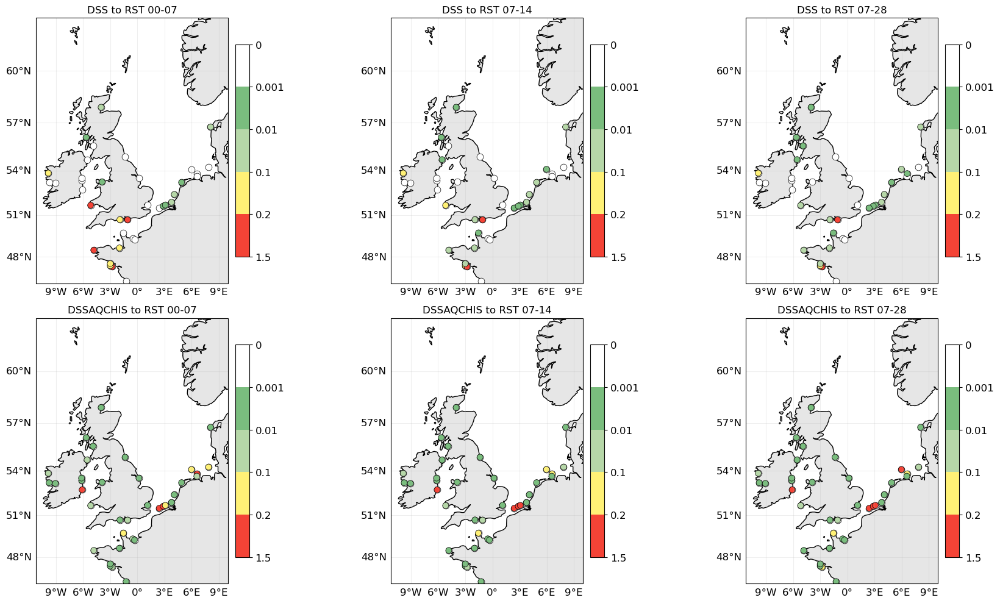

In [19]:


def plot_rst_avg_map(stats, known_rst_sites, scenario, timeframe, ax=None):
    # Unified bins and colors for all plots
    if scenario == "dss":
        bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
        category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
        legend_labels = ['0','0.001', '0.01', '0.1', '0.2', '1.5']
        cat_col = "norm_pathogen_concentration_category"
    elif scenario == "dssaqchis":
        bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
        category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
        legend_labels = ['0','0.001', '0.01', '0.1', '0.2', '1.5']
        cat_col = "rel_pathogen_concentration_category"
    else:
        raise ValueError("Unknown scenario")

    cmap = ListedColormap(category_colors)
    norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))
    if ax is None:
        fig, ax = plt.subplots(1, 1, subplot_kw={"projection": ccrs.Mercator()}, figsize=(7, 7))
    else:
        fig = ax.figure

    # Plot restoration sites
    known_rst_sites.plot.scatter(
        x="lon_hex0", y="lat_hex0", s=60, color="white",
        edgecolor='black', linewidth=0.5, ax=ax, transform=ccrs.PlateCarree()
    )

    # Plot risk categories
    scatter = ax.scatter(
        stats["lon"], stats["lat"],
        c=stats[cat_col],
        edgecolor='black', linewidth=0.5,
        cmap=cmap, norm=norm, s=50, transform=ccrs.PlateCarree()
    )

    ax.coastlines(zorder=0)
    ax.set_extent([-11.2, 10, 46, 62.5])
    ax.add_feature(cfeature.LAND, facecolor='#e6e6e6', zorder=-1)
    gl = ax.gridlines(draw_labels=True, zorder=0, alpha=0.2)
    gl.xlocator = ticker.MultipleLocator(3)
    gl.ylocator = ticker.MultipleLocator(3)
    gl.xlabel_style = {'size': 12}
    gl.ylabel_style = {'size': 12}
    gl.top_labels = False
    gl.right_labels = False

    cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
    cbar.ax.tick_params(labelsize=12)
    cbar.set_ticks(bins)
    cbar.set_ticklabels(legend_labels)
    cbar.ax.invert_yaxis()
    ax.set_title(f"{scenario.upper()} to RST {timeframe}")

    return ax

# --- Plot all in a 2x3 grid with unified color scale ---
fig, axes = plt.subplots(2, 3, subplot_kw={"projection": ccrs.Mercator()}, figsize=(18, 10))
scenarios = [
    ("dss", dss_to_rst_stats_07, known_rst_sites_07, "00-07"),
    ("dss", dss_to_rst_stats_14, known_rst_sites_14, "07-14"),
    ("dss", dss_to_rst_stats_28, known_rst_sites_28, "07-28"),
    ("dssaqchis", dssaqchis_to_rst_stats_07, known_rst_sites_07, "00-07"),
    ("dssaqchis", dssaqchis_to_rst_stats_14, known_rst_sites_14, "07-14"),
    ("dssaqchis", dssaqchis_to_rst_stats_28, known_rst_sites_28, "07-28"),
]
for ax, (scenario, stats, known_rst, timeframe) in zip(axes.flat, scenarios):
    plot_rst_avg_map(stats, known_rst, scenario, timeframe, ax=ax)
plt.tight_layout()
plt.show()

### Diseased to Restoration AVERAGE 00-07

In [20]:
dss_to_rst_01y = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_07.rst_count_hex1 > 0)
)

In [21]:
known_rst_sites = ds_conn_07.rst_count_hex0.where(ds_conn_07.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [22]:
dss = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0),
    drop=True,
)

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",14319.000000
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",56988.473684
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",144.571429
"(-2, -43, 45)",-3.398617,47.645165,"(-2, -43, 45)",4479.967742
"(-3, -42, 45)",-3.598835,47.722247,"(-3, -42, 45)",708.492063
"(-30, 12, 18)",-9.847694,53.837064,"(-30, 12, 18)",35412.888889
"(-31, 11, 20)",-10.035484,53.591686,"(-31, 11, 20)",5.600000
"(-4, -41, 45)",-3.799659,47.798947,"(-4, -41, 45)",235.222222
"(-4, 24, -20)",-4.011904,57.918896,"(-4, 24, -20)",9684.088889


In [24]:
dss_destinations_01y = dss_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()

In [25]:
dss_origin_count_01y = (dss_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [26]:
total_particles_from_dss = dss.sum().item()


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / total_particles_from_dss * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,pathogen_concentration,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,,,
"(1, -47, 46)",-2.802199,47.255569,10.0,85078.256047,0.436612,1.000000,1.0
"(-9, -34, 43)",-4.824256,48.488479,8.0,72417.542671,0.371638,0.851187,0.8
"(0, -46, 46)",-3.000000,47.333794,8.0,27112.799808,0.139140,0.318681,0.8
"(0, -45, 45)",-3.000000,47.489861,6.0,36567.592955,0.187661,0.429811,0.6
"(5, -40, 35)",-1.983200,48.655073,5.0,30077.699989,0.154355,0.353530,0.5
"(-30, 12, 18)",-9.847694,53.837064,2.0,35418.488889,0.181764,0.416305,0.2
"(5, -27, 22)",-1.939319,50.680946,2.0,28246.078873,0.144956,0.332001,0.2
"(-10, -13, 23)",-5.168404,51.677740,1.0,56988.473684,0.292458,0.669836,0.1
"(-11, 16, -5)",-5.652154,56.105601,1.0,144.571429,0.000742,0.001699,0.1


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    18.000000
mean      0.133468
std       0.140238
min       0.000055
25%       0.008905
50%       0.104678
75%       0.186186
max       0.436612
Name: norm_pathogen_concentration, dtype: float64

In [ ]:
correlation = dss_to_rst_stats['num_dss_sources'].corr(dss_to_rst_stats['norm_pathogen_concentration'])
print(f"Correlation between number of sources and arriving particles: {correlation:.2f}")

Correlation between number of sources and arriving particles: 0.67


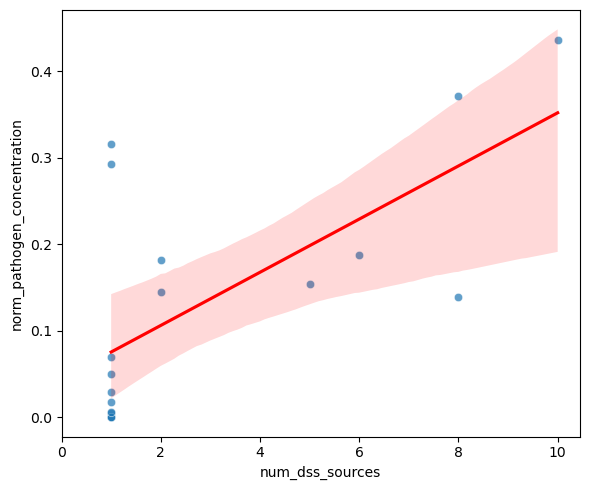

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 5))
sns.scatterplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    alpha=0.7
)
plt.xlabel("Number of connected diseased source populations")
plt.ylabel("Relative pathogen concentration (arriving particles)")
plt.xlim(0, )

sns.regplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    scatter=False,
    color="red"
)

plt.tight_layout()
plt.show()

In [214]:
dss_to_rst_stats["num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)
dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)


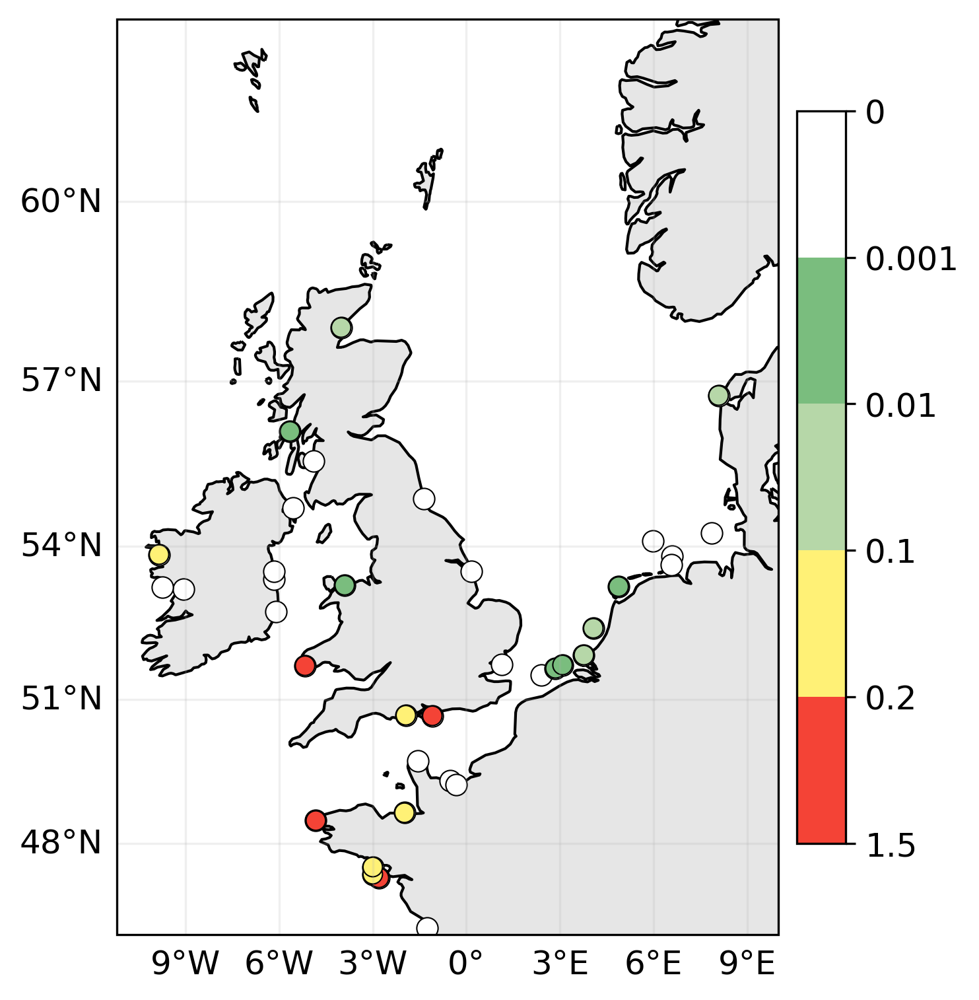

In [215]:
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))

fig, ax = plt.subplots(
    1, 1,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(6,6),
)
fig.set_dpi(300)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=60, 
    color="white", 
    edgecolor='black', linewidth=0.5,
    ax=ax, transform=cartopy.crs.PlateCarree()
)

scatter = ax.scatter(
    dss_to_rst_stats["lon"], dss_to_rst_stats["lat"],
    c=dss_to_rst_stats["norm_pathogen_concentration_category"],
    edgecolor='black', linewidth=0.5,
    cmap=cmap, norm=norm, s=50, transform=cartopy.crs.PlateCarree()
)

ax.coastlines(zorder=0)
#ax.set_title("normalized pathogen concentration")
ax.set_extent([-11.2, 10, 46, 62.5])
ax.add_feature(cfeature.LAND, facecolor='#e6e6e6', zorder=-1)
gl = ax.gridlines(draw_labels=True, zorder=0, alpha=0.2)
gl.xlocator = ticker.MultipleLocator(3)
gl.ylocator = ticker.MultipleLocator(3) 
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.top_labels=False
gl.right_labels=False

cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()

plt.show()

### Diseased to restoration VARIABILITY 00-07

In [304]:
dss_to_rst_01y = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_07.rst_count_hex1 > 0)
)

In [305]:
dss = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0),
    drop=True,
)

In [306]:
known_rst_sites = ds_conn_07.rst_count_hex0.where(ds_conn_07.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [307]:
all_rst_sites = known_rst_sites.index.get_level_values('hex0').unique()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["hex1"]).compute().to_dataframe()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

lon_hex0   lat_hex0       hex_label  \
month year hex0                                                  
0.0   0.0  (-1, -44, 45)  -3.199006  47.567702   (-1, -44, 45)   
           (-10, -13, 23) -5.168404  51.677740  (-10, -13, 23)   
           (-2, -43, 45)  -3.398617  47.645165   (-2, -43, 45)   
           (-3, -42, 45)  -3.598835  47.722247   (-3, -42, 45)   
           (-30, 12, 18)  -9.847694  53.837064   (-30, 12, 18)   
...                             ...        ...             ...   
4.0   2.0  (2, -46, 44)   -2.602597  47.489117    (2, -46, 44)   
           (2, -47, 45)   -2.603801  47.333052    (2, -47, 45)   
           (5, -27, 22)   -1.939319  50.680946    (5, -27, 22)   
           (5, -40, 35)   -1.983200  48.655073    (5, -40, 35)   
           (6, -40, 34)   -1.777946  48.730928    (6, -40, 34)   

                           obs_per_origin_area  
month year hex0                                 
0.0   0.0  (-1, -44, 45)           1159.333333  
           (-10, -13, 23)          4887.000000  
           (-2, -43, 45)           1114.645161  
           (-3, -42, 45)            245.777778  
           (-30, 12, 18)            872.285714  
...                                        ...  
4.0   2.0  (2, -46, 44)              57.913043  
           (2, -47, 45)              52.295775  
           (5, -27, 22)              67.200000  
           (5, -40, 35)              94.714286  
           (6, -40, 34)              42.108108  

[430 rows x 4 columns]

In [309]:
dss_destinations_01y = dss_to_rst_01y.sum("hex0").compute().to_dataframe()

In [310]:
dss_origin_count_01y = (dss_to_rst_01y > 0).sum("hex0").compute().to_dataframe()

In [311]:
released_particles = (
    dss
    .sum(dim="hex1")
    .to_dataframe()
    .groupby(['month', 'year'])
    .sum()
    .rename(columns={'obs_per_origin_area': 'released_particles'})
    .reset_index()
)

In [ ]:
released_particles

,month,year,lon_hex0,lat_hex0,hex_label,released_particles
0,0.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.262366e+06
1,0.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.305075e+06
2,0.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.337458e+06
3,0.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.430508e+06
4,1.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.122877e+06
5,1.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.616797e+06
6,1.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.369653e+06
7,1.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.380510e+06
8,2.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.214802e+06
9,2.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.341154e+06


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats = dss_to_rst_stats.reset_index().merge(
    released_particles[['month', 'year', 'released_particles']],
    on=['month', 'year'],
    how='left'
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["released_particles"] * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = (
    dss_to_rst_stats.groupby(["month", "year"])["pathogen_concentration"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats["rel_num_dss_sources"] = (
    dss_to_rst_stats.groupby(["month", "year"])["num_dss_sources"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
0,0.0,2.0,"(1, -47, 46)",-2.802199,47.255569,9.0,5245.732099,1.337458e+06,0.392217,0.971858,1.000000
1,2.0,2.0,"(1, -47, 46)",-2.802199,47.255569,8.0,10302.195946,1.322833e+06,0.778798,1.000000,1.000000
2,0.0,0.0,"(1, -47, 46)",-2.802199,47.255569,8.0,4608.217104,1.262366e+06,0.365046,0.942954,1.000000
3,0.0,1.0,"(0, -46, 46)",-3.000000,47.333794,7.0,1042.898044,1.305075e+06,0.079911,0.174180,1.000000
4,2.0,2.0,"(0, -46, 46)",-3.000000,47.333794,7.0,2579.570160,1.322833e+06,0.195003,0.250390,0.875000
...,...,...,...,...,...,...,...,...,...,...,...
234,2.0,0.0,"(31, -31, 0)",3.764009,51.888537,1.0,400.145455,1.214802e+06,0.032939,0.048960,0.142857
235,2.0,0.0,"(35, -24, -11)",4.878878,53.225639,1.0,191.470588,1.214802e+06,0.015761,0.023428,0.142857
236,2.0,0.0,"(5, -27, 22)",-1.939319,50.680946,1.0,1792.000000,1.214802e+06,0.147514,0.219262,0.142857
237,2.0,0.0,"(9, -29, 20)",-1.091058,50.669724,1.0,3620.638298,1.214802e+06,0.298044,0.443007,0.142857


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    239.000000
mean       0.189945
std        0.189222
min        0.000127
25%        0.031768
50%        0.143730
75%        0.287008
max        1.258584
Name: norm_pathogen_concentration, dtype: float64

In [227]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

In [228]:
# Reset the index to make 'month', 'year', and 'hex1' regular columns
dss_to_rst_stats = dss_to_rst_stats.reset_index()

In [229]:
# Define mappings for month and year
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}

# Replace numerical month and year with corresponding names
dss_to_rst_stats['month'] = dss_to_rst_stats['month'].map(month_mapping)
dss_to_rst_stats['year'] = dss_to_rst_stats['year'].map(year_mapping)


In [230]:
dss_to_rst_stats['month_year'] = dss_to_rst_stats['month'] + '-' + dss_to_rst_stats['year']

In [ ]:
dss_to_rst_stats

,index,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category,norm_pathogen_concentration_category,month_year
0,0,05,2021,"(1, -47, 46)",-2.802199,47.255569,9.0,5245.732099,1.337458e+06,0.392217,0.971858,1.000000,4.0,4.0,4.0,05-2021
1,1,07,2021,"(1, -47, 46)",-2.802199,47.255569,8.0,10302.195946,1.322833e+06,0.778798,1.000000,1.000000,4.0,4.0,4.0,07-2021
2,2,05,2019,"(1, -47, 46)",-2.802199,47.255569,8.0,4608.217104,1.262366e+06,0.365046,0.942954,1.000000,4.0,4.0,4.0,05-2019
3,3,05,2020,"(0, -46, 46)",-3.000000,47.333794,7.0,1042.898044,1.305075e+06,0.079911,0.174180,1.000000,4.0,3.0,2.0,05-2020
4,4,07,2021,"(0, -46, 46)",-3.000000,47.333794,7.0,2579.570160,1.322833e+06,0.195003,0.250390,0.875000,4.0,4.0,3.0,07-2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234,234,07,2019,"(31, -31, 0)",3.764009,51.888537,1.0,400.145455,1.214802e+06,0.032939,0.048960,0.142857,0.0,1.0,2.0,07-2019
235,235,07,2019,"(35, -24, -11)",4.878878,53.225639,1.0,191.470588,1.214802e+06,0.015761,0.023428,0.142857,0.0,1.0,2.0,07-2019
236,236,07,2019,"(5, -27, 22)",-1.939319,50.680946,1.0,1792.000000,1.214802e+06,0.147514,0.219262,0.142857,0.0,3.0,3.0,07-2019
237,237,07,2019,"(9, -29, 20)",-1.091058,50.669724,1.0,3620.638298,1.214802e+06,0.298044,0.443007,0.142857,0.0,4.0,4.0,07-2019


In [ ]:
mean_norm_pathogen_concentration_per_hex1 = dss_to_rst_stats.groupby('hex1')['norm_pathogen_concentration'].mean().sort_values(ascending=False)

print(mean_norm_pathogen_concentration_per_hex1)

hex1
(1, -47, 46)      0.391879
(-9, -34, 43)     0.382798
(-10, -13, 23)    0.366596
(9, -29, 20)      0.358142
(-30, 12, 18)     0.230270
(0, -45, 45)      0.185277
(5, -40, 35)      0.165324
(5, -27, 22)      0.158410
(0, -46, 46)      0.143286
(45, -5, -40)     0.103513
(-4, 24, -20)     0.058193
(32, -28, -4)     0.053330
(31, -31, 0)      0.028314
(35, -24, -11)    0.008364
(-4, -6, 10)      0.005171
(-11, 16, -5)     0.003840
(28, -31, 3)      0.001491
(27, -31, 4)      0.000889
Name: norm_pathogen_concentration, dtype: float64


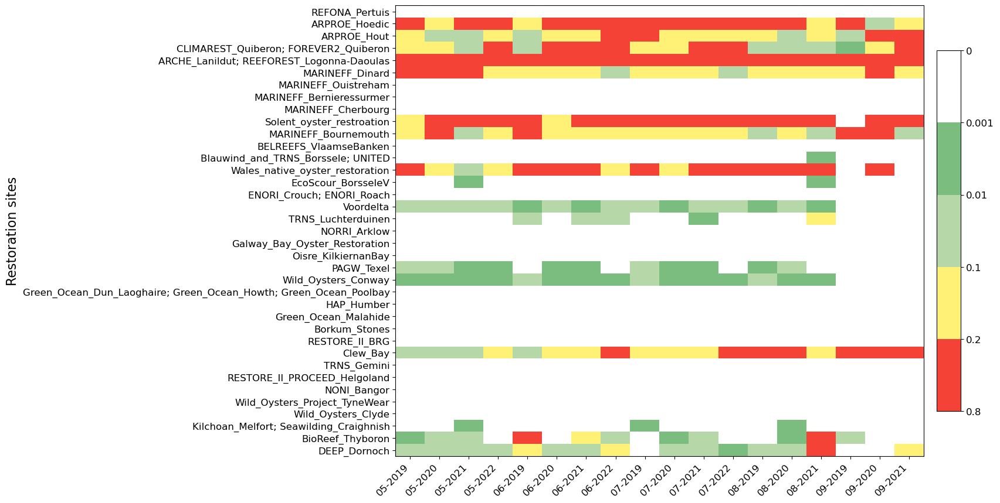

In [ ]:

category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))
#cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='norm_pathogen_concentration_category',
    aggfunc='first'  
)

heatmap_data_categorical = heatmap_data_categorical.reindex(all_rst_sites)

# mean of 'norm_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

hex0_to_lat = known_rst_sites['lat_hex0']
sorted_by_lat = hex0_to_lat.loc[all_rst_sites].sort_values().index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_by_lat]

fig, ax = plt.subplots(figsize=(14, 10))

im = ax.imshow(
    heatmap_data_categorical.values,
    aspect='auto',
    cmap=cmap,
    norm=norm
)

ax.set_xticks(np.arange(len(heatmap_data_categorical.columns)))
ax.set_xticklabels(heatmap_data_categorical.columns, rotation=45, ha='right', fontsize=12)
#ax.set_yticks(np.arange(len(heatmap_data_categorical.index)))
#ax.set_yticklabels(heatmap_data_categorical.index, fontsize=12)
resto_labels = [hex_to_rst_name.loc[str(h)] if str(h) in hex_to_rst_name.index else str(h) for h in heatmap_data_categorical.index]
ax.set_yticks(np.arange(len(resto_labels)))
ax.set_yticklabels(resto_labels, fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('Restoration sites', fontsize=16)


cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()
# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


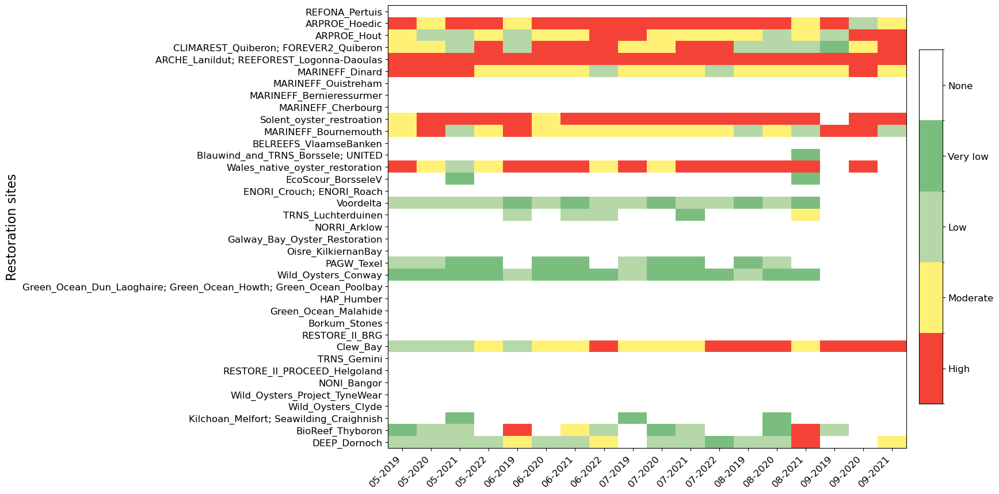

In [118]:

category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))
#cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='norm_pathogen_concentration_category',
    aggfunc='first'  
)

heatmap_data_categorical = heatmap_data_categorical.reindex(all_rst_sites)

# mean of 'norm_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

hex0_to_lat = known_rst_sites['lat_hex0']
sorted_by_lat = hex0_to_lat.loc[all_rst_sites].sort_values().index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_by_lat]

fig, ax = plt.subplots(figsize=(14, 10))

im = ax.imshow(
    heatmap_data_categorical.values,
    aspect='auto',
    cmap=cmap,
    norm=norm
)

ax.set_xticks(np.arange(len(heatmap_data_categorical.columns)))
ax.set_xticklabels(heatmap_data_categorical.columns, rotation=45, ha='right', fontsize=12)
#ax.set_yticks(np.arange(len(heatmap_data_categorical.index)))
#ax.set_yticklabels(heatmap_data_categorical.index, fontsize=12)
resto_labels = [hex_to_rst_name.loc[str(h)] if str(h) in hex_to_rst_name.index else str(h) for h in heatmap_data_categorical.index]
ax.set_yticks(np.arange(len(resto_labels)))
ax.set_yticklabels(resto_labels, fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('Restoration sites', fontsize=16)


bin_centers = [(bins[i] + bins[i+1]) / 2 for i in range(len(bins)-1)]
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bin_centers)
cbar.set_ticklabels(['None', 'Very low', 'Low', 'Moderate', 'High'])
cbar.ax.invert_yaxis()

# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


### Diseased to restoration AVERAGE 07-14

In [ ]:
dss_to_rst_01y = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_14.rst_count_hex1 > 0)
)

In [ ]:
known_rst_sites = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dss = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
)

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",12944.518519
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",21273.157895
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",2.095238
"(-11, 5, 6)",-5.540939,54.395456,"(-11, 5, 6)",80.131579
"(-2, -43, 45)",-3.398617,47.645165,"(-2, -43, 45)",8817.774194
"(-3, -42, 45)",-3.598835,47.722247,"(-3, -42, 45)",3709.238095
"(-30, 12, 18)",-9.847694,53.837064,"(-30, 12, 18)",27525.460317
"(-30, 15, 15)",-9.924893,54.301393,"(-30, 15, 15)",8.557692
"(-4, -41, 45)",-3.799659,47.798947,"(-4, -41, 45)",1072.694444


In [ ]:
dss_destinations_01y = dss_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()

In [ ]:
dss_origin_count_01y = (dss_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [ ]:
total_particles_from_dss = dss.sum().item()

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / total_particles_from_dss * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,pathogen_concentration,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,,,
"(0, -46, 46)",-3.000000,47.333794,14.0,25743.751042,0.132114,0.242092,1.000000
"(-9, -34, 43)",-4.824256,48.488479,12.0,7012.605743,0.035988,0.065946,0.857143
"(1, -47, 46)",-2.802199,47.255569,11.0,106338.781507,0.545718,1.000000,0.785714
"(0, -45, 45)",-3.000000,47.489861,9.0,14727.988844,0.075582,0.138501,0.642857
"(5, -40, 35)",-1.983200,48.655073,6.0,2321.821061,0.011915,0.021834,0.428571
"(-30, 12, 18)",-9.847694,53.837064,2.0,27534.018010,0.141301,0.258927,0.142857
"(32, -28, -4)",4.067194,52.417435,2.0,10421.906952,0.053484,0.098007,0.142857
"(5, -27, 22)",-1.939319,50.680946,2.0,10402.777465,0.053386,0.097827,0.142857
"(-10, -13, 23)",-5.168404,51.677740,1.0,21273.157895,0.109171,0.200051,0.071429


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    21.000000
mean      0.073011
std       0.128998
min       0.000011
25%       0.002649
50%       0.027896
75%       0.075582
max       0.545718
Name: norm_pathogen_concentration, dtype: float64

In [ ]:
correlation = dss_to_rst_stats['num_dss_sources'].corr(dss_to_rst_stats['norm_pathogen_concentration'])
print(f"Correlation between number of sources and arriving particles: {correlation:.2f}")

Correlation between number of sources and arriving particles: 0.44


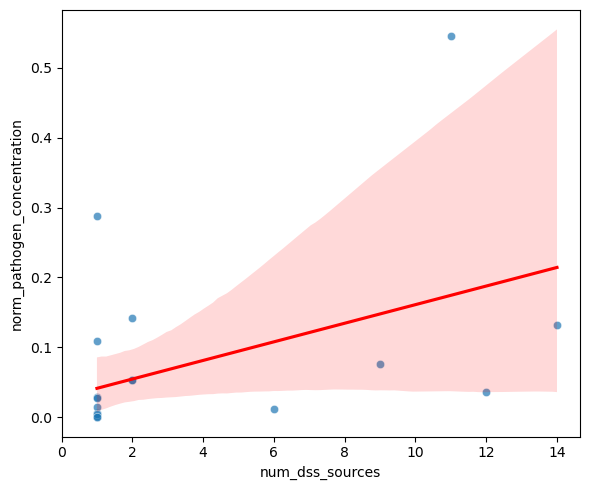

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 5))
sns.scatterplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    alpha=0.7
)
plt.xlabel("Number of connected diseased source populations")
plt.ylabel("Relative pathogen concentration (arriving particles)")
plt.xlim(0, )

sns.regplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    scatter=False,
    color="red"
)

plt.tight_layout()
plt.show()

In [ ]:
dss_to_rst_stats["num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)
dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)


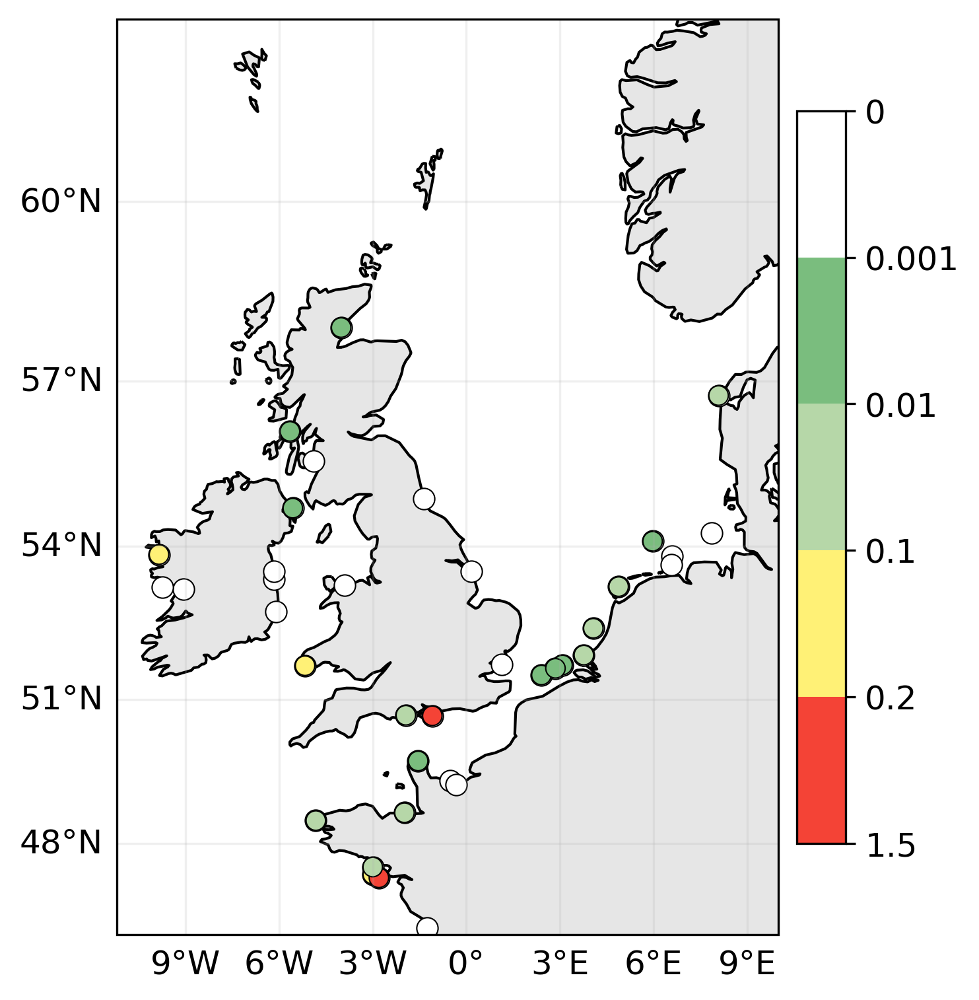

In [ ]:
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))

fig, ax = plt.subplots(
    1, 1,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(6,6),
)
fig.set_dpi(300)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=60, 
    color="white", 
    edgecolor='black', linewidth=0.5,
    ax=ax, transform=cartopy.crs.PlateCarree()
)

scatter = ax.scatter(
    dss_to_rst_stats["lon"], dss_to_rst_stats["lat"],
    c=dss_to_rst_stats["norm_pathogen_concentration_category"],
    edgecolor='black', linewidth=0.5,
    cmap=cmap, norm=norm, s=50, transform=cartopy.crs.PlateCarree()
)

ax.coastlines(zorder=0)
#ax.set_title("normalized pathogen concentration")
ax.set_extent([-11.2, 10, 46, 62.5])
ax.add_feature(cfeature.LAND, facecolor='#e6e6e6', zorder=-1)
gl = ax.gridlines(draw_labels=True, zorder=0, alpha=0.2)
gl.xlocator = ticker.MultipleLocator(3)
gl.ylocator = ticker.MultipleLocator(3) 
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.top_labels=False
gl.right_labels=False

cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()

plt.show()

### Diseased to restoration VARIABILITY 07-14

In [315]:
dss_to_rst_01y = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_14.rst_count_hex1 > 0)
)

In [316]:
dss = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
)

In [317]:
known_rst_sites = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [318]:
all_rst_sites = known_rst_sites.index.get_level_values('hex0').unique()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["hex1"]).compute().to_dataframe()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

lon_hex0   lat_hex0       hex_label  \
month year hex0                                                  
0.0   0.0  (-1, -44, 45)  -3.199006  47.567702   (-1, -44, 45)   
           (-10, -13, 23) -5.168404  51.677740  (-10, -13, 23)   
           (-2, -43, 45)  -3.398617  47.645165   (-2, -43, 45)   
           (-3, -42, 45)  -3.598835  47.722247   (-3, -42, 45)   
           (-30, 12, 18)  -9.847694  53.837064   (-30, 12, 18)   
...                             ...        ...             ...   
4.0   2.0  (10, -29, 19)  -0.875500  50.743765   (10, -29, 19)   
           (2, -46, 44)   -2.602597  47.489117    (2, -46, 44)   
           (2, -47, 45)   -2.603801  47.333052    (2, -47, 45)   
           (3, -39, 36)   -2.389897  48.658131    (3, -39, 36)   
           (6, -40, 34)   -1.777946  48.730928    (6, -40, 34)   

                           obs_per_origin_area  
month year hex0                                 
0.0   0.0  (-1, -44, 45)            652.296296  
           (-10, -13, 23)          1152.473684  
           (-2, -43, 45)            885.677419  
           (-3, -42, 45)           1008.190476  
           (-30, 12, 18)            614.285714  
...                                        ...  
4.0   2.0  (10, -29, 19)            616.000000  
           (2, -46, 44)             521.217391  
           (2, -47, 45)             218.084507  
           (3, -39, 36)              31.627907  
           (6, -40, 34)               7.189189  

[396 rows x 4 columns]

In [320]:
dss_destinations_01y = dss_to_rst_01y.sum("hex0").compute().to_dataframe()

In [321]:
dss_origin_count_01y = (dss_to_rst_01y > 0).sum("hex0").compute().to_dataframe()

In [322]:
released_particles = (
    dss
    .sum(dim="hex1")
    .to_dataframe()
    .groupby(['month', 'year'])
    .sum()
    .rename(columns={'obs_per_origin_area': 'released_particles'})
    .reset_index()
)

In [ ]:
released_particles

,month,year,lon_hex0,lat_hex0,hex_label,released_particles
0,0.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.262366e+06
1,0.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.305075e+06
2,0.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.337458e+06
3,0.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.430508e+06
4,1.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.122877e+06
5,1.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.616797e+06
6,1.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.369653e+06
7,1.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.380510e+06
8,2.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.214802e+06
9,2.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",1.341154e+06


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats = dss_to_rst_stats.reset_index().merge(
    released_particles[['month', 'year', 'released_particles']],
    on=['month', 'year'],
    how='left'
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["released_particles"] * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = (
    dss_to_rst_stats.groupby(["month", "year"])["pathogen_concentration"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats["rel_num_dss_sources"] = (
    dss_to_rst_stats.groupby(["month", "year"])["num_dss_sources"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
0,2.0,2.0,"(0, -46, 46)",-3.000000,47.333794,10.0,3159.605135,1.322833e+06,0.238851,0.265757,1.000
1,2.0,0.0,"(0, -46, 46)",-3.000000,47.333794,10.0,3484.793899,1.214802e+06,0.286861,0.341446,1.000
2,2.0,2.0,"(1, -47, 46)",-2.802199,47.255569,10.0,11889.090219,1.322833e+06,0.898760,1.000000,1.000
3,2.0,0.0,"(1, -47, 46)",-2.802199,47.255569,10.0,10205.989875,1.214802e+06,0.840136,1.000000,1.000
4,1.0,0.0,"(1, -47, 46)",-2.802199,47.255569,10.0,4447.634496,1.122877e+06,0.396093,0.954903,1.000
...,...,...,...,...,...,...,...,...,...,...,...
218,1.0,3.0,"(-30, 12, 18)",-9.847694,53.837064,1.0,3300.761905,1.380510e+06,0.239097,0.565147,0.125
219,1.0,3.0,"(-4, 24, -20)",-4.011904,57.918896,1.0,14.622222,1.380510e+06,0.001059,0.002504,0.125
220,1.0,3.0,"(31, -31, 0)",3.764009,51.888537,1.0,175.636364,1.380510e+06,0.012723,0.030072,0.125
221,1.0,3.0,"(32, -28, -4)",4.067194,52.417435,1.0,1184.647059,1.380510e+06,0.085812,0.202832,0.125


In [325]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

In [326]:
# Reset the index to make 'month', 'year', and 'hex1' regular columns
dss_to_rst_stats = dss_to_rst_stats.reset_index()

In [327]:
# Define mappings for month and year
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}

# Replace numerical month and year with corresponding names
dss_to_rst_stats['month'] = dss_to_rst_stats['month'].map(month_mapping)
dss_to_rst_stats['year'] = dss_to_rst_stats['year'].map(year_mapping)


In [328]:
dss_to_rst_stats['month_year'] = dss_to_rst_stats['month'] + '-' + dss_to_rst_stats['year']

In [ ]:
dss_to_rst_stats

,index,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category,norm_pathogen_concentration_category,month_year
0,0,07,2021,"(0, -46, 46)",-3.000000,47.333794,10.0,3159.605135,1.322833e+06,0.238851,0.265757,1.000,4.0,4.0,4.0,07-2021
1,1,07,2019,"(0, -46, 46)",-3.000000,47.333794,10.0,3484.793899,1.214802e+06,0.286861,0.341446,1.000,4.0,4.0,4.0,07-2019
2,2,07,2021,"(1, -47, 46)",-2.802199,47.255569,10.0,11889.090219,1.322833e+06,0.898760,1.000000,1.000,4.0,4.0,4.0,07-2021
3,3,07,2019,"(1, -47, 46)",-2.802199,47.255569,10.0,10205.989875,1.214802e+06,0.840136,1.000000,1.000,4.0,4.0,4.0,07-2019
4,4,06,2019,"(1, -47, 46)",-2.802199,47.255569,10.0,4447.634496,1.122877e+06,0.396093,0.954903,1.000,4.0,4.0,4.0,06-2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,218,06,2022,"(-30, 12, 18)",-9.847694,53.837064,1.0,3300.761905,1.380510e+06,0.239097,0.565147,0.125,0.0,4.0,4.0,06-2022
219,219,06,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,14.622222,1.380510e+06,0.001059,0.002504,0.125,0.0,0.0,1.0,06-2022
220,220,06,2022,"(31, -31, 0)",3.764009,51.888537,1.0,175.636364,1.380510e+06,0.012723,0.030072,0.125,0.0,1.0,2.0,06-2022
221,221,06,2022,"(32, -28, -4)",4.067194,52.417435,1.0,1184.647059,1.380510e+06,0.085812,0.202832,0.125,0.0,3.0,2.0,06-2022


In [ ]:
mean_norm_pathogen_concentration_per_hex1 = dss_to_rst_stats.groupby('hex1')['norm_pathogen_concentration'].mean().sort_values(ascending=False)

print(mean_norm_pathogen_concentration_per_hex1)

hex1
(1, -47, 46)      0.572520
(9, -29, 20)      0.315841
(-30, 12, 18)     0.202752
(0, -46, 46)      0.163912
(-10, -13, 23)    0.132919
(32, -28, -4)     0.093278
(45, -5, -40)     0.078774
(0, -45, 45)      0.073510
(5, -27, 22)      0.056140
(-9, -34, 43)     0.049282
(31, -31, 0)      0.034647
(35, -24, -11)    0.017635
(27, -31, 4)      0.016375
(5, -40, 35)      0.013919
(39, -20, -19)    0.012153
(-4, 24, -20)     0.010563
(7, -34, 27)      0.007219
(28, -31, 3)      0.006743
(-11, 7, 4)       0.001618
(25, -31, 6)      0.000903
(-11, 16, -5)     0.000172
Name: norm_pathogen_concentration, dtype: float64


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    223.000000
mean       0.134022
std        0.199465
min        0.000114
25%        0.012177
50%        0.047884
75%        0.162729
max        1.318136
Name: norm_pathogen_concentration, dtype: float64

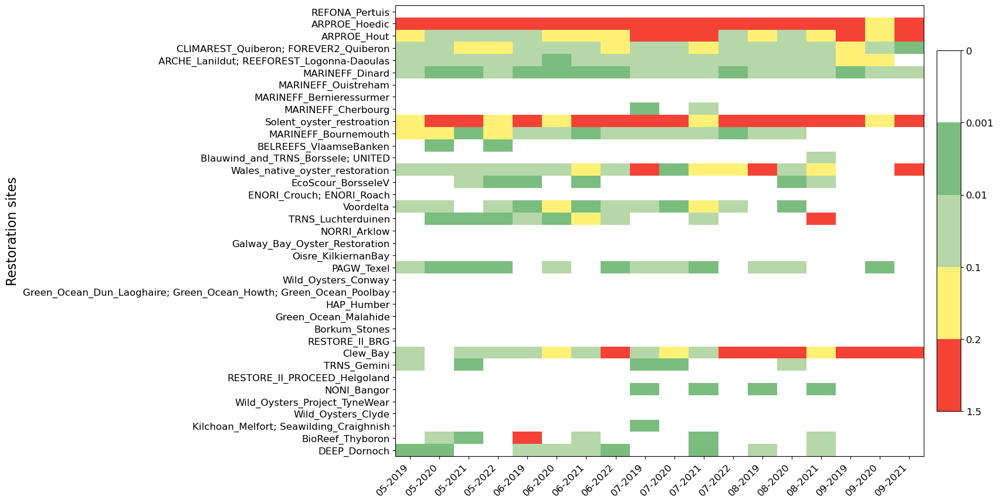

In [285]:

category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))
#cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='norm_pathogen_concentration_category',
    aggfunc='first'  
)

heatmap_data_categorical = heatmap_data_categorical.reindex(all_rst_sites)

# mean of 'norm_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

hex0_to_lat = known_rst_sites['lat_hex0']
sorted_by_lat = hex0_to_lat.loc[all_rst_sites].sort_values().index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_by_lat]

fig, ax = plt.subplots(figsize=(14, 10))

im = ax.imshow(
    heatmap_data_categorical.values,
    aspect='auto',
    cmap=cmap,
    norm=norm
)

ax.set_xticks(np.arange(len(heatmap_data_categorical.columns)))
ax.set_xticklabels(heatmap_data_categorical.columns, rotation=45, ha='right', fontsize=12)
#ax.set_yticks(np.arange(len(heatmap_data_categorical.index)))
#ax.set_yticklabels(heatmap_data_categorical.index, fontsize=12)
resto_labels = [hex_to_rst_name.loc[str(h)] if str(h) in hex_to_rst_name.index else str(h) for h in heatmap_data_categorical.index]
ax.set_yticks(np.arange(len(resto_labels)))
ax.set_yticklabels(resto_labels, fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('Restoration sites', fontsize=16)


cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()
# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


### Diseased to restoration AVERAGE 07-28

In [ ]:
dss_to_rst_01y = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_28.rst_count_hex1 > 0)
)

In [ ]:
known_rst_sites = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dss = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
)

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -36, 37)",-3.204015,48.815593,"(-1, -36, 37)",66.666667
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",27980.222222
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",32066.052632
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",2.095238
"(-11, 5, 6)",-5.540939,54.395456,"(-11, 5, 6)",636.473684
"(-2, -35, 37)",-3.408674,48.892978,"(-2, -35, 37)",118.581081
"(-2, -43, 45)",-3.398617,47.645165,"(-2, -43, 45)",19761.677419
"(-3, -35, 38)",-3.612033,48.814059,"(-3, -35, 38)",68.387097
"(-3, -42, 45)",-3.598835,47.722247,"(-3, -42, 45)",10106.984127


In [ ]:
dss_destinations_01y = dss_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()

In [ ]:
dss_origin_count_01y = (dss_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [ ]:
total_particles_from_dss = dss.sum().item()


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / total_particles_from_dss * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,pathogen_concentration,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,,,
"(-9, -34, 43)",-4.824256,48.488479,16.0,10729.643829,0.020935,0.043610,1.0000
"(1, -47, 46)",-2.802199,47.255569,15.0,246038.715648,0.480054,1.000000,0.9375
"(0, -46, 46)",-3.000000,47.333794,15.0,53415.314561,0.104220,0.217101,0.9375
"(0, -45, 45)",-3.000000,47.489861,12.0,42656.039211,0.083228,0.173371,0.7500
"(7, -34, 27)",-1.544287,49.741493,10.0,877.544721,0.001712,0.003567,0.6250
"(5, -40, 35)",-1.983200,48.655073,7.0,6501.222384,0.012685,0.026424,0.4375
"(-30, 12, 18)",-9.847694,53.837064,2.0,70071.256105,0.136718,0.284798,0.1250
"(-11, 7, 4)",-5.560333,54.706424,2.0,570.701754,0.001114,0.002320,0.1250
"(9, -29, 20)",-1.091058,50.669724,2.0,117963.463830,0.230162,0.479451,0.1250


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    23.000000
mean      0.056727
std       0.107778
min       0.000004
25%       0.001558
50%       0.020692
75%       0.050173
max       0.480054
Name: norm_pathogen_concentration, dtype: float64

In [ ]:
correlation = dss_to_rst_stats['num_dss_sources'].corr(dss_to_rst_stats['norm_pathogen_concentration'])
print(f"Correlation between number of sources and arriving particles: {correlation:.2f}")

Correlation between number of sources and arriving particles: 0.46


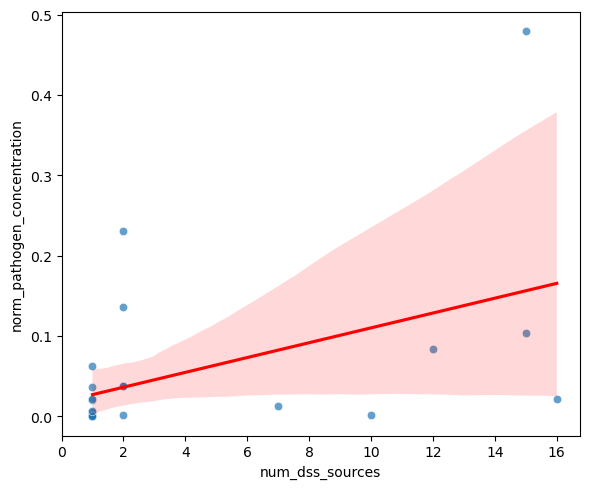

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 5))
sns.scatterplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    alpha=0.7
)
plt.xlabel("Number of connected diseased source populations")
plt.ylabel("Relative pathogen concentration (arriving particles)")
plt.xlim(0, )

sns.regplot(
    data=dss_to_rst_stats,
    x="num_dss_sources",
    y="norm_pathogen_concentration",
    scatter=False,
    color="red"
)

plt.tight_layout()
plt.show()

In [ ]:
dss_to_rst_stats["num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)
dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)


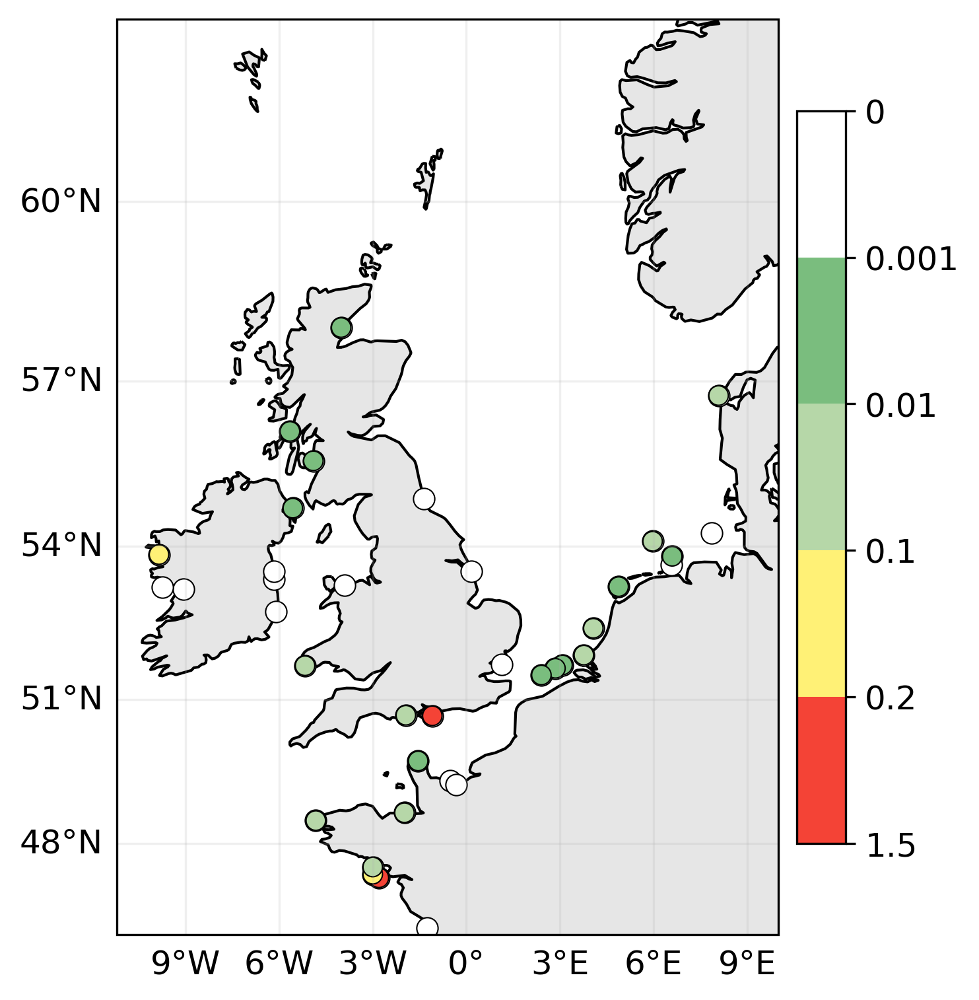

In [ ]:
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))

fig, ax = plt.subplots(
    1, 1,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(6,6),
)
fig.set_dpi(300)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=60, 
    color="white", 
    edgecolor='black', linewidth=0.5,
    ax=ax, transform=cartopy.crs.PlateCarree()
)

scatter = ax.scatter(
    dss_to_rst_stats["lon"], dss_to_rst_stats["lat"],
    c=dss_to_rst_stats["norm_pathogen_concentration_category"],
    edgecolor='black', linewidth=0.5,
    cmap=cmap, norm=norm, s=50, transform=cartopy.crs.PlateCarree()
)

ax.coastlines(zorder=0)
#ax.set_title("normalized pathogen concentration")
ax.set_extent([-11.2, 10, 46, 62.5])
ax.add_feature(cfeature.LAND, facecolor='#e6e6e6', zorder=-1)
gl = ax.gridlines(draw_labels=True, zorder=0, alpha=0.2)
gl.xlocator = ticker.MultipleLocator(3)
gl.ylocator = ticker.MultipleLocator(3) 
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.top_labels=False
gl.right_labels=False

cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()

plt.show()

### Diseased to restoration VARIABILITY 07-28

In [332]:
dss_to_rst_01y = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_28.rst_count_hex1 > 0)
)

In [333]:
dss = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
)

In [334]:
known_rst_sites = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [335]:
all_rst_sites = known_rst_sites.index.get_level_values('hex0').unique()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["hex1"]).compute().to_dataframe()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

lon_hex0   lat_hex0       hex_label  \
month year hex0                                                  
0.0   0.0  (-1, -44, 45)  -3.199006  47.567702   (-1, -44, 45)   
           (-10, -13, 23) -5.168404  51.677740  (-10, -13, 23)   
           (-11, 5, 6)    -5.540939  54.395456     (-11, 5, 6)   
           (-2, -43, 45)  -3.398617  47.645165   (-2, -43, 45)   
           (-3, -42, 45)  -3.598835  47.722247   (-3, -42, 45)   
...                             ...        ...             ...   
4.0   2.0  (10, -29, 19)  -0.875500  50.743765   (10, -29, 19)   
           (2, -46, 44)   -2.602597  47.489117    (2, -46, 44)   
           (2, -47, 45)   -2.603801  47.333052    (2, -47, 45)   
           (3, -39, 36)   -2.389897  48.658131    (3, -39, 36)   
           (6, -40, 34)   -1.777946  48.730928    (6, -40, 34)   

                           obs_per_origin_area  
month year hex0                                 
0.0   0.0  (-1, -44, 45)           1523.851852  
           (-10, -13, 23)          1544.684211  
           (-11, 5, 6)                6.868421  
           (-2, -43, 45)           2113.548387  
           (-3, -42, 45)           2940.555556  
...                                        ...  
4.0   2.0  (10, -29, 19)            645.489362  
           (2, -46, 44)            1507.347826  
           (2, -47, 45)             379.422535  
           (3, -39, 36)              33.488372  
           (6, -40, 34)              27.729730  

[487 rows x 4 columns]

In [337]:
dss_destinations_01y = dss_to_rst_01y.sum("hex0").compute().to_dataframe()

In [338]:
dss_origin_count_01y = (dss_to_rst_01y > 0).sum("hex0").compute().to_dataframe()

In [339]:
released_particles = (
    dss
    .sum(dim="hex1")
    .to_dataframe()
    .groupby(['month', 'year'])
    .sum()
    .rename(columns={'obs_per_origin_area': 'released_particles'})
    .reset_index()
)

In [ ]:
released_particles

,month,year,lon_hex0,lat_hex0,hex_label,released_particles
0,0.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.320287e+06
1,0.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.432618e+06
2,0.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.517794e+06
3,0.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.762534e+06
4,1.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",2.953399e+06
5,1.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",4.252513e+06
6,1.0,2.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.602473e+06
7,1.0,3.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.631029e+06
8,2.0,0.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.195181e+06
9,2.0,1.0,-227.410952,3240.977209,"(-1, -36, 37)(-1, -43, 44)(-1, -44, 45)(-10, -...",3.527515e+06


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "pathogen_concentration"})
    [["pathogen_concentration"]]
)

dss_to_rst_stats = dss_to_rst_stats.reset_index().merge(
    released_particles[['month', 'year', 'released_particles']],
    on=['month', 'year'],
    how='left'
)

dss_to_rst_stats["norm_pathogen_concentration"] = (
    dss_to_rst_stats["pathogen_concentration"] / dss_to_rst_stats["released_particles"] * 100
)

dss_to_rst_stats["rel_pathogen_concentration"] = (
    dss_to_rst_stats.groupby(["month", "year"])["pathogen_concentration"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats["rel_num_dss_sources"] = (
    dss_to_rst_stats.groupby(["month", "year"])["num_dss_sources"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources
0,3.0,1.0,"(1, -47, 46)",-2.802199,47.255569,14.0,18733.126897,3.520326e+06,0.532142,1.000000,1.000000
1,1.0,1.0,"(1, -47, 46)",-2.802199,47.255569,14.0,30533.382525,4.252513e+06,0.718008,1.000000,1.000000
2,2.0,2.0,"(1, -47, 46)",-2.802199,47.255569,14.0,17188.183375,3.479326e+06,0.494009,1.000000,1.000000
3,3.0,1.0,"(0, -46, 46)",-3.000000,47.333794,13.0,3182.156619,3.520326e+06,0.090394,0.169868,0.928571
4,2.0,2.0,"(0, -46, 46)",-3.000000,47.333794,13.0,5577.555115,3.479326e+06,0.160306,0.324499,0.928571
...,...,...,...,...,...,...,...,...,...,...,...
255,1.0,3.0,"(35, -24, -11)",4.878878,53.225639,1.0,13.588235,3.631029e+06,0.000374,0.000812,0.083333
256,1.0,3.0,"(45, -5, -40)",8.080625,56.741595,1.0,449.784946,3.631029e+06,0.012387,0.026890,0.083333
257,1.0,3.0,"(5, -27, 22)",-1.939319,50.680946,1.0,478.800000,3.631029e+06,0.013186,0.028625,0.083333
258,1.0,3.0,"(9, -29, 20)",-1.091058,50.669724,1.0,15562.191489,3.631029e+06,0.428589,0.930377,0.083333


In [342]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.01, 0.05, 0.1, 0.25, 1],
    #bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

dss_to_rst_stats["norm_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.norm_pathogen_concentration,
    bins=[0, 0.001, 0.01, 0.1, 0.2, 1.5],
    labels=[0, 1, 2, 3, 4],
    #duplicates='drop'
).astype(float)

In [343]:
# Reset the index to make 'month', 'year', and 'hex1' regular columns
dss_to_rst_stats = dss_to_rst_stats.reset_index()

In [344]:
# Define mappings for month and year
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}

# Replace numerical month and year with corresponding names
dss_to_rst_stats['month'] = dss_to_rst_stats['month'].map(month_mapping)
dss_to_rst_stats['year'] = dss_to_rst_stats['year'].map(year_mapping)


In [345]:
dss_to_rst_stats['month_year'] = dss_to_rst_stats['month'] + '-' + dss_to_rst_stats['year']

In [ ]:
dss_to_rst_stats

,index,month,year,hex1,lon,lat,num_dss_sources,pathogen_concentration,released_particles,norm_pathogen_concentration,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category,norm_pathogen_concentration_category,month_year
0,0,08,2020,"(1, -47, 46)",-2.802199,47.255569,14.0,18733.126897,3.520326e+06,0.532142,1.000000,1.000000,4.0,4.0,4.0,08-2020
1,1,06,2020,"(1, -47, 46)",-2.802199,47.255569,14.0,30533.382525,4.252513e+06,0.718008,1.000000,1.000000,4.0,4.0,4.0,06-2020
2,2,07,2021,"(1, -47, 46)",-2.802199,47.255569,14.0,17188.183375,3.479326e+06,0.494009,1.000000,1.000000,4.0,4.0,4.0,07-2021
3,3,08,2020,"(0, -46, 46)",-3.000000,47.333794,13.0,3182.156619,3.520326e+06,0.090394,0.169868,0.928571,4.0,3.0,2.0,08-2020
4,4,07,2021,"(0, -46, 46)",-3.000000,47.333794,13.0,5577.555115,3.479326e+06,0.160306,0.324499,0.928571,4.0,4.0,3.0,07-2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,255,06,2022,"(35, -24, -11)",4.878878,53.225639,1.0,13.588235,3.631029e+06,0.000374,0.000812,0.083333,0.0,0.0,0.0,06-2022
256,256,06,2022,"(45, -5, -40)",8.080625,56.741595,1.0,449.784946,3.631029e+06,0.012387,0.026890,0.083333,0.0,1.0,2.0,06-2022
257,257,06,2022,"(5, -27, 22)",-1.939319,50.680946,1.0,478.800000,3.631029e+06,0.013186,0.028625,0.083333,0.0,1.0,2.0,06-2022
258,258,06,2022,"(9, -29, 20)",-1.091058,50.669724,1.0,15562.191489,3.631029e+06,0.428589,0.930377,0.083333,0.0,4.0,4.0,06-2022


In [ ]:
mean_norm_pathogen_concentration_per_hex1 = dss_to_rst_stats.groupby('hex1')['norm_pathogen_concentration'].mean().sort_values(ascending=False)

print(mean_norm_pathogen_concentration_per_hex1)

hex1
(1, -47, 46)      0.504635
(9, -29, 20)      0.227080
(-30, 12, 18)     0.196266
(0, -46, 46)      0.113085
(0, -45, 45)      0.074629
(-10, -13, 23)    0.071866
(39, -20, -19)    0.071025
(45, -5, -40)     0.050143
(32, -28, -4)     0.045509
(5, -27, 22)      0.037135
(-9, -34, 43)     0.026186
(31, -31, 0)      0.019774
(5, -40, 35)      0.014279
(28, -31, 3)      0.012737
(35, -24, -11)    0.010864
(27, -31, 4)      0.007602
(-4, 24, -20)     0.004480
(7, -34, 27)      0.004290
(-8, 11, -3)      0.002247
(-11, 7, 4)       0.001748
(25, -31, 6)      0.001685
(42, -23, -19)    0.000316
(-11, 16, -5)     0.000066
Name: norm_pathogen_concentration, dtype: float64


In [ ]:
dss_to_rst_stats.norm_pathogen_concentration.describe()

count    260.000000
mean       0.095270
std        0.161892
min        0.000051
25%        0.007985
50%        0.027355
75%        0.096957
max        1.186711
Name: norm_pathogen_concentration, dtype: float64

: 

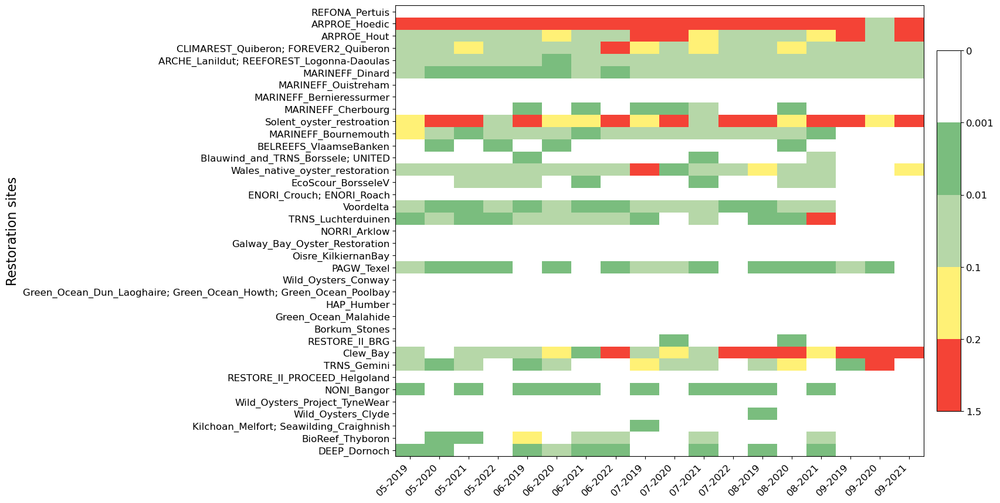

In [303]:

category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#f44336']
cmap = ListedColormap(category_colors)
bins = [-0.5, 0, 1.5, 2.5, 3.5, 4.5]
norm = BoundaryNorm(boundaries=bins, ncolors=len(category_colors))
#cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='norm_pathogen_concentration_category',
    aggfunc='first'  
)

heatmap_data_categorical = heatmap_data_categorical.reindex(all_rst_sites)

# mean of 'norm_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

hex0_to_lat = known_rst_sites['lat_hex0']
sorted_by_lat = hex0_to_lat.loc[all_rst_sites].sort_values().index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_by_lat]

fig, ax = plt.subplots(figsize=(14, 10))

im = ax.imshow(
    heatmap_data_categorical.values,
    aspect='auto',
    cmap=cmap,
    norm=norm
)

ax.set_xticks(np.arange(len(heatmap_data_categorical.columns)))
ax.set_xticklabels(heatmap_data_categorical.columns, rotation=45, ha='right', fontsize=12)
#ax.set_yticks(np.arange(len(heatmap_data_categorical.index)))
#ax.set_yticklabels(heatmap_data_categorical.index, fontsize=12)
resto_labels = [hex_to_rst_name.loc[str(h)] if str(h) in hex_to_rst_name.index else str(h) for h in heatmap_data_categorical.index]
ax.set_yticks(np.arange(len(resto_labels)))
ax.set_yticklabels(resto_labels, fontsize=12)
ax.set_xlabel('')
ax.set_ylabel('Restoration sites', fontsize=16)


cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=12)
cbar.set_ticks(bins)
cbar.set_ticklabels(['0','0.001', '0.01', '0.1', '0.2', '1.5'])
cbar.ax.invert_yaxis()
# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


### Diseased + aquaculture + historical to restoration AVERAGE 00-07

In [35]:
dssaqchis_to_rst_01y = ds_conn_07.obs_per_origin_area.where(
    (ds_conn_07.dss_count_hex0 > 0) | (ds_conn_07.his_count_hex0 > 0) | (ds_conn_07.aqc_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_07.rst_count_hex1 > 0)
)

In [36]:
known_rst_sites = ds_conn_07.rst_count_hex0.where(ds_conn_07.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dssaqchis_origins_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",14319.000000
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",56988.473684
"(-10, 13, -3)",-5.387340,55.721769,"(-10, 13, -3)",2147.473684
"(-11, -12, 23)",-5.389237,51.751233,"(-11, -12, 23)",21223.690476
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",144.571429
...,...,...,...,...
"(9, -35, 26)",-1.128520,49.735222,"(9, -35, 26)",14126.000000
"(9, -36, 27)",-1.134589,49.579428,"(9, -36, 27)",4127.306667
"(9, -37, 28)",-1.140609,49.423620,"(9, -37, 28)",741.384615


In [38]:
dssaqchis_destinations_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()

In [39]:
dssaqchis_origin_count_01y = (dssaqchis_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [ ]:
dssaqchis_to_rst_stats = (
    dssaqchis_origin_count_01y
    .where(dssaqchis_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.join(
    dssaqchis_destinations_01y
    .where(dssaqchis_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dssaqchis_to_rst_stats["rel_pathogen_concentration"] /= dssaqchis_to_rst_stats["rel_pathogen_concentration"].max()

dssaqchis_to_rst_stats["rel_num_dss_sources"] = dssaqchis_to_rst_stats["num_dss_sources"] / dssaqchis_to_rst_stats["num_dss_sources"].max()

dssaqchis_to_rst_stats.where(dssaqchis_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,
"(25, -31, 6)",2.403683,51.492413,14.0,0.515186,1.000000
"(1, -47, 46)",-2.802199,47.255569,12.0,0.136838,0.857143
"(7, -34, 27)",-1.544287,49.741493,12.0,0.440565,0.857143
"(27, -31, 4)",2.854403,51.626277,11.0,1.000000,0.785714
"(39, -20, -19)",5.967033,54.087844,10.0,0.360461,0.714286
"(-10, -13, 23)",-5.168404,51.677740,9.0,0.199940,0.642857
"(28, -31, 3)",3.080785,51.692529,9.0,0.356427,0.642857
"(0, -46, 46)",-3.000000,47.333794,9.0,0.043548,0.642857
"(-11, 7, 4)",-5.560333,54.706424,8.0,0.174413,0.571429


In [ ]:
dssaqchis_to_rst_stats.num_dss_sources.unique()

array([14., 12., 11., 10.,  9.,  8.,  7.,  6.,  5.,  4.,  3.,  2.,  1.])

In [143]:
#dssaqchis_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
#    dssaqchis_to_rst_stats.rel_num_dss_sources,
#    bins=[0, 0.25, 0.5, 0.75, 1],  # Define 4 bins
#    labels=[1, 2, 3, 4]
#).astype(float)
#dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
#    dssaqchis_to_rst_stats.rel_pathogen_concentration,
#    bins=[0, 0.25, 0.5, 0.75, 1],  # Define 4 bins
#    labels=[1, 2, 3, 4]
#).astype(float)
#
dssaqchis_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_num_dss_sources,
    bins=[-0.5, 0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[0, 1, 2, 3, 4, 5],
    #duplicates='drop'
).astype(float)

dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_pathogen_concentration,
    #bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    bins=[-0.5, 0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[0, 1, 2, 3, 4, 5],
    #duplicates='drop'
).astype(float)

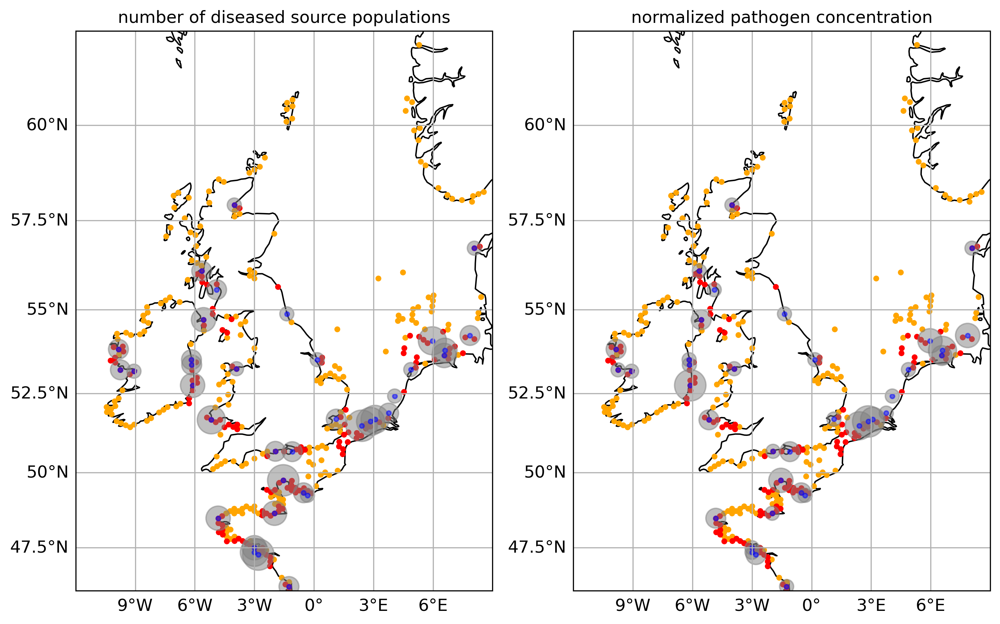

In [225]:
fig, ax = plt.subplots(
    1, 2,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

fig.patch.set_alpha(0.7)

_dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.copy()

_dssaqchis_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s=10,
    alpha=0.5, color="blue",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s=10,
    alpha=0.5, color="blue",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)


ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

#fig.savefig("plots/041_rest-sites_risk-analsysis_dssaqchis_05m_00-07.pdf")

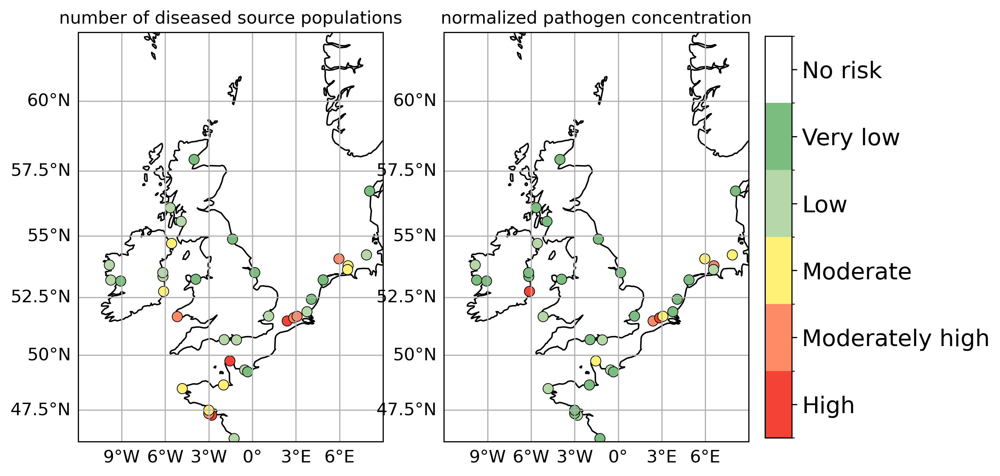

In [230]:
fig, ax = plt.subplots(
    1, 2,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

bins = [0, 1, 2, 3, 4, 5]
category_colors = ['#ffffff','#7ABD7E', '#b6d7a8' ,'#fff176','#ff8a65','#f44336']
cmap = ListedColormap(category_colors)
norm = BoundaryNorm(boundaries=[-0.5, 0.5, 1.5, 2.5, 3.5, 4.5, 5.5], ncolors=len(category_colors))

scatter1 = ax[0].scatter(
    dssaqchis_to_rst_stats["lon"], dssaqchis_to_rst_stats["lat"],
    c=dssaqchis_to_rst_stats["rel_num_dss_sources_category"],
    edgecolor='black', linewidth=0.5,
    cmap=cmap, norm=norm, s=50, transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)
ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

scatter2 = ax[1].scatter(
    dssaqchis_to_rst_stats["lon"], dssaqchis_to_rst_stats["lat"],
    c=dssaqchis_to_rst_stats["rel_pathogen_concentration_category"],
    edgecolor='black', linewidth=0.5,
    cmap=cmap, norm=norm, s=50, transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)
ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

cbar = fig.colorbar(scatter1, ax=ax, orientation='vertical', pad=0.02, shrink=0.8, aspect=15)
cbar.ax.tick_params(labelsize=16)
cbar.set_ticks(bins)  # Set colorbar ticks to match your categories
cbar.set_ticklabels(['No risk', 'Very low', 'Low', 'Moderate', 'Moderately high', 'High']) 
cbar.ax.invert_yaxis()  

#fig.savefig("plots/041_rest-sites_risk-analsysis_dssaqchis_05m_00-07.pdf")

## KOLLAPS

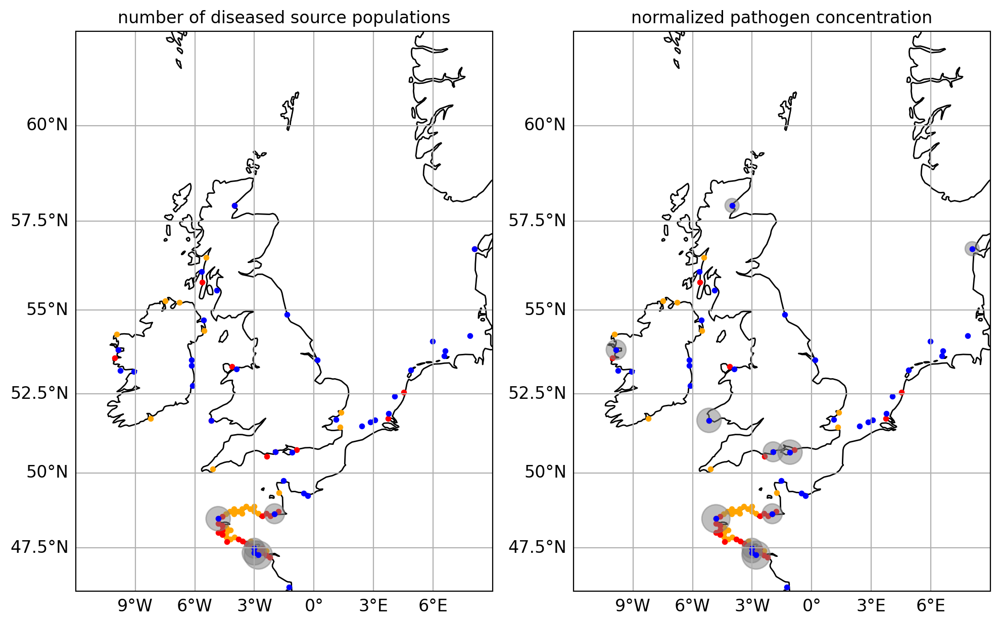

In [ ]:
fig, ax = plt.subplots(
    1, 2,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(200)

fig.patch.set_alpha(0.7)

_dss_to_rst_stats = dss_to_rst_stats.copy()

_dss_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dss_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_05m_00-07.pdf")

### Diseased + aquaculture + historical to restoration AVERAGE 07-14

In [51]:
dssaqchis_to_rst_01y = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0) | (ds_conn_14.his_count_hex0 > 0) | (ds_conn_14.aqc_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_14.rst_count_hex1 > 0)
)

In [52]:
known_rst_sites = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dssaqchis_origins_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",12944.518519
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",21273.157895
"(-10, 13, -3)",-5.387340,55.721769,"(-10, 13, -3)",2089.368421
"(-11, -12, 23)",-5.389237,51.751233,"(-11, -12, 23)",10915.416667
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",2.095238
...,...,...,...,...
"(9, -35, 26)",-1.128520,49.735222,"(9, -35, 26)",1866.000000
"(9, -36, 27)",-1.134589,49.579428,"(9, -36, 27)",238.133333
"(9, -37, 28)",-1.140609,49.423620,"(9, -37, 28)",223.326923


In [ ]:
dssaqchis_destinations_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()
dssaqchis_destinations_01y

,lon_hex1,lat_hex1,obs_per_origin_area
hex1,,,
"(-1, -19, 20)",-3.215782,51.464504,0.0
"(-1, -2, 3)",-3.229353,54.110720,0.0
"(-1, -20, 21)",-3.215043,51.308774,0.0
"(-1, -21, 22)",-3.214311,51.153035,0.0
"(-1, -24, 25)",-3.212150,50.685757,0.0
...,...,...,...
"(9, 5, -14)",-0.838398,55.959362,0.0
"(9, 6, -15)",-0.829731,56.114857,0.0
"(9, 7, -16)",-0.820982,56.270351,0.0


In [55]:
dssaqchis_origin_count_01y = (dssaqchis_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [ ]:
dssaqchis_to_rst_stats = (
    dssaqchis_origin_count_01y
    .where(dssaqchis_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.join(
    dssaqchis_destinations_01y
    .where(dssaqchis_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dssaqchis_to_rst_stats["rel_pathogen_concentration"] /= dssaqchis_to_rst_stats["rel_pathogen_concentration"].max()

dssaqchis_to_rst_stats["rel_num_dss_sources"] = dssaqchis_to_rst_stats["num_dss_sources"] / dssaqchis_to_rst_stats["num_dss_sources"].max()

dssaqchis_to_rst_stats.where(dssaqchis_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,
"(25, -31, 6)",2.403683,51.492413,21.0,0.765507,1.000000
"(39, -20, -19)",5.967033,54.087844,16.0,0.382111,0.761905
"(7, -34, 27)",-1.544287,49.741493,16.0,0.302291,0.761905
"(0, -46, 46)",-3.000000,47.333794,16.0,0.045931,0.761905
"(-11, 7, 4)",-5.560333,54.706424,14.0,0.057311,0.666667
"(1, -47, 46)",-2.802199,47.255569,14.0,0.187584,0.666667
"(5, -40, 35)",-1.983200,48.655073,14.0,0.012270,0.666667
"(27, -31, 4)",2.854403,51.626277,13.0,1.000000,0.619048
"(-9, -34, 43)",-4.824256,48.488479,13.0,0.012178,0.619048


In [ ]:
dssaqchis_to_rst_stats.num_dss_sources.unique()

array([21., 16., 14., 13., 11.,  8.,  7.,  6.,  5.,  4.,  3.,  2.,  1.])

In [58]:
dssaqchis_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)
dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)

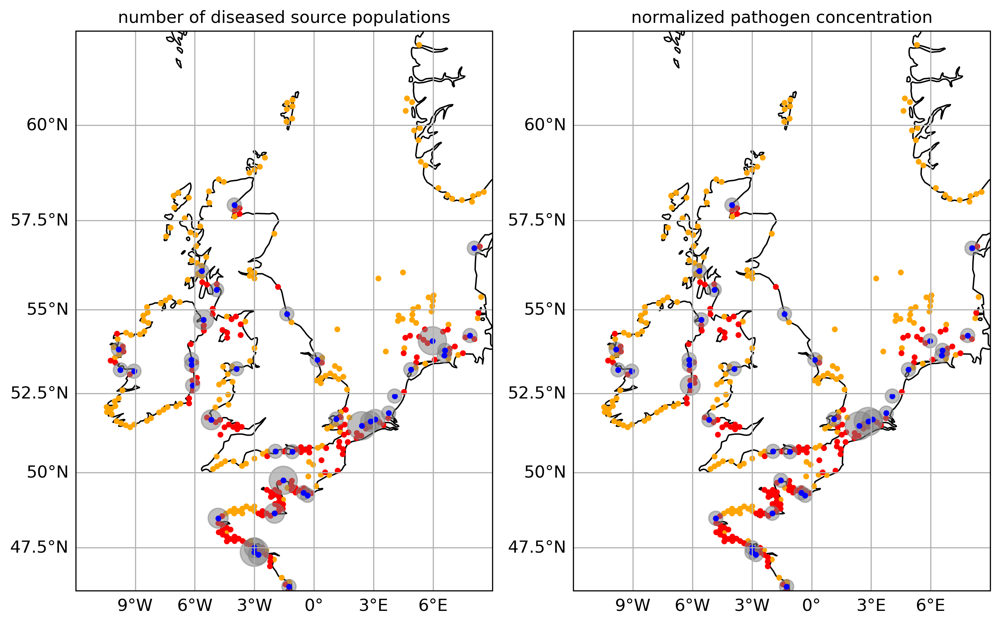

In [59]:
fig, ax = plt.subplots(
    1, 2,
    # subplot_kw={"projection": cartopy.crs.Stereographic(
    #     central_longitude=ds_conn.hex_proj__lon_origin,
    #     central_latitude=ds_conn.hex_proj__lat_origin,
    # )},
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

fig.patch.set_alpha(0.7)

_dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.copy()

_dssaqchis_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue",
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue",
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_dssaqchis_05m_07-14.pdf")

### Diseased to Restoration AVERAGE 07-14

In [60]:
dss_to_rst_01y = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_14.rst_count_hex1 > 0)
)

In [61]:
known_rst_sites = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",12944.518519
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",21273.157895
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",2.095238
"(-11, 5, 6)",-5.540939,54.395456,"(-11, 5, 6)",80.131579
"(-2, -43, 45)",-3.398617,47.645165,"(-2, -43, 45)",8817.774194
"(-3, -42, 45)",-3.598835,47.722247,"(-3, -42, 45)",3709.238095
"(-30, 12, 18)",-9.847694,53.837064,"(-30, 12, 18)",27525.460317
"(-30, 15, 15)",-9.924893,54.301393,"(-30, 15, 15)",8.557692
"(-4, -41, 45)",-3.799659,47.798947,"(-4, -41, 45)",1072.694444


In [63]:
dss_destinations_01y = dss_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()

In [64]:
dss_origin_count_01y = (dss_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dss_to_rst_stats["rel_pathogen_concentration"] /= dss_to_rst_stats["rel_pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,
"(0, -46, 46)",-3.000000,47.333794,14.0,0.242092,1.000000
"(-9, -34, 43)",-4.824256,48.488479,12.0,0.065946,0.857143
"(1, -47, 46)",-2.802199,47.255569,11.0,1.000000,0.785714
"(0, -45, 45)",-3.000000,47.489861,9.0,0.138501,0.642857
"(5, -40, 35)",-1.983200,48.655073,6.0,0.021834,0.428571
"(-30, 12, 18)",-9.847694,53.837064,2.0,0.258927,0.142857
"(32, -28, -4)",4.067194,52.417435,2.0,0.098007,0.142857
"(5, -27, 22)",-1.939319,50.680946,2.0,0.097827,0.142857
"(-10, -13, 23)",-5.168404,51.677740,1.0,0.200051,0.071429


In [ ]:
dss_to_rst_stats.num_dss_sources.unique()

array([14., 12., 11.,  9.,  6.,  2.,  1.])

In [67]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)
dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)

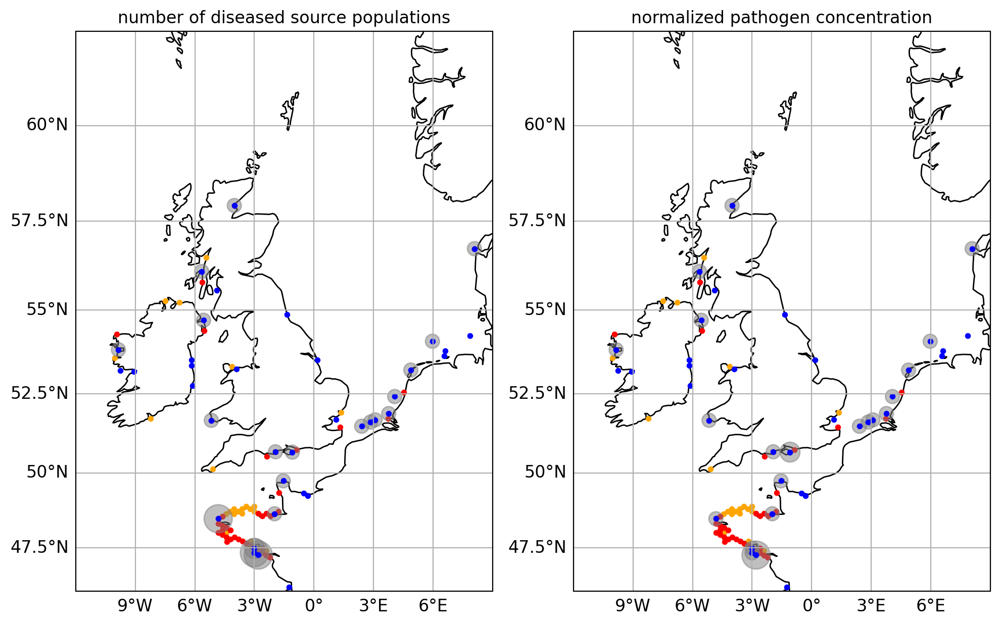

In [68]:
fig, ax = plt.subplots(
    1, 2,
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(200)

fig.patch.set_alpha(0.7)

_dss_to_rst_stats = dss_to_rst_stats.copy()

_dss_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dss_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_05m_07-14.pdf")

### Diseased to restoration VARIABILITY 07-14

In [69]:
dss_to_rst_01y = ds_conn_14.obs_per_origin_area.where(
    (ds_conn_14.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_14.rst_count_hex1 > 0)
)

In [70]:
known_rst_sites = ds_conn_14.rst_count_hex0.where(ds_conn_14.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["hex1"]).compute().to_dataframe()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

lon_hex0   lat_hex0       hex_label  \
month year hex0                                                  
0.0   0.0  (-1, -44, 45)  -3.199006  47.567702   (-1, -44, 45)   
           (-10, -13, 23) -5.168404  51.677740  (-10, -13, 23)   
           (-2, -43, 45)  -3.398617  47.645165   (-2, -43, 45)   
           (-3, -42, 45)  -3.598835  47.722247   (-3, -42, 45)   
           (-30, 12, 18)  -9.847694  53.837064   (-30, 12, 18)   
...                             ...        ...             ...   
4.0   2.0  (10, -29, 19)  -0.875500  50.743765   (10, -29, 19)   
           (2, -46, 44)   -2.602597  47.489117    (2, -46, 44)   
           (2, -47, 45)   -2.603801  47.333052    (2, -47, 45)   
           (3, -39, 36)   -2.389897  48.658131    (3, -39, 36)   
           (6, -40, 34)   -1.777946  48.730928    (6, -40, 34)   

                           obs_per_origin_area  
month year hex0                                 
0.0   0.0  (-1, -44, 45)            652.296296  
           (-10, -13, 23)          1152.473684  
           (-2, -43, 45)            885.677419  
           (-3, -42, 45)           1008.190476  
           (-30, 12, 18)            614.285714  
...                                        ...  
4.0   2.0  (10, -29, 19)            616.000000  
           (2, -46, 44)             521.217391  
           (2, -47, 45)             218.084507  
           (3, -39, 36)              31.627907  
           (6, -40, 34)               7.189189  

[396 rows x 4 columns]

In [72]:
dss_destinations_01y = dss_to_rst_01y.sum("hex0").compute().to_dataframe()

In [73]:
dss_origin_count_01y = (dss_to_rst_01y > 0).sum("hex0").compute().to_dataframe()

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dss_to_rst_stats["rel_pathogen_concentration"] /= dss_to_rst_stats["rel_pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

lon        lat  num_dss_sources  \
month year hex1                                                  
2.0   2.0  (0, -46, 46)  -3.000000  47.333794             10.0   
      0.0  (0, -46, 46)  -3.000000  47.333794             10.0   
      2.0  (1, -47, 46)  -2.802199  47.255569             10.0   
      0.0  (1, -47, 46)  -2.802199  47.255569             10.0   
1.0   0.0  (1, -47, 46)  -2.802199  47.255569             10.0   
...                            ...        ...              ...   
      3.0  (-30, 12, 18) -9.847694  53.837064              1.0   
           (-4, 24, -20) -4.011904  57.918896              1.0   
           (31, -31, 0)   3.764009  51.888537              1.0   
           (32, -28, -4)  4.067194  52.417435              1.0   
      2.0  (28, -31, 3)   3.080785  51.692529              1.0   

                          rel_pathogen_concentration  rel_num_dss_sources  
month year hex1                                                            
2.0   2.0  (0, -46, 46)                     0.239622                  1.0  
      0.0  (0, -46, 46)                     0.264284                  1.0  
      2.0  (1, -47, 46)                     0.901660                  1.0  
      0.0  (1, -47, 46)                     0.774015                  1.0  
1.0   0.0  (1, -47, 46)                     0.337305                  1.0  
...                                              ...                  ...  
      3.0  (-30, 12, 18)                    0.250327                  0.1  
           (-4, 24, -20)                    0.001109                  0.1  
           (31, -31, 0)                     0.013320                  0.1  
           (32, -28, -4)                    0.089843                  0.1  
      2.0  (28, -31, 3)                     0.005328                  0.1  

[223 rows x 5 columns]

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

#note that hear we have to first group by month and year to calculate relative values within the respective monthxyear combination
dss_to_rst_stats["rel_pathogen_concentration"] = (
    dss_to_rst_stats.groupby(["month", "year"])["rel_pathogen_concentration"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats["rel_num_dss_sources"] = (
    dss_to_rst_stats.groupby(["month", "year"])["num_dss_sources"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

lon        lat  num_dss_sources  \
month year hex1                                                  
2.0   2.0  (0, -46, 46)  -3.000000  47.333794             10.0   
      0.0  (0, -46, 46)  -3.000000  47.333794             10.0   
      2.0  (1, -47, 46)  -2.802199  47.255569             10.0   
      0.0  (1, -47, 46)  -2.802199  47.255569             10.0   
1.0   0.0  (1, -47, 46)  -2.802199  47.255569             10.0   
...                            ...        ...              ...   
      3.0  (-30, 12, 18) -9.847694  53.837064              1.0   
           (-4, 24, -20) -4.011904  57.918896              1.0   
           (31, -31, 0)   3.764009  51.888537              1.0   
           (32, -28, -4)  4.067194  52.417435              1.0   
      2.0  (28, -31, 3)   3.080785  51.692529              1.0   

                          rel_pathogen_concentration  rel_num_dss_sources  
month year hex1                                                            
2.0   2.0  (0, -46, 46)                     0.265757                1.000  
      0.0  (0, -46, 46)                     0.341446                1.000  
      2.0  (1, -47, 46)                     1.000000                1.000  
      0.0  (1, -47, 46)                     1.000000                1.000  
1.0   0.0  (1, -47, 46)                     0.954903                1.000  
...                                              ...                  ...  
      3.0  (-30, 12, 18)                    0.565147                0.125  
           (-4, 24, -20)                    0.002504                0.125  
           (31, -31, 0)                     0.030072                0.125  
           (32, -28, -4)                    0.202832                0.125  
      2.0  (28, -31, 3)                     0.007783                0.125  

[223 rows x 5 columns]

In [76]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[1, 2, 3, 4, 5],
).astype(float)

dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[1, 2, 3, 4, 5],
).astype(float)

In [77]:
# Reset the index to make 'month', 'year', and 'hex1' regular columns
dss_to_rst_stats = dss_to_rst_stats.reset_index()

In [78]:
# Define mappings for month and year
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}

# Replace numerical month and year with corresponding names
dss_to_rst_stats['month'] = dss_to_rst_stats['month'].map(month_mapping)
dss_to_rst_stats['year'] = dss_to_rst_stats['year'].map(year_mapping)


In [79]:
dss_to_rst_stats['month_year'] = dss_to_rst_stats['month'] + '-' + dss_to_rst_stats['year']

In [ ]:
# Get the count of each category in rel_pathogen_concentration_category
category_counts = dss_to_rst_stats['rel_pathogen_concentration_category'].value_counts()

print(category_counts)

unique_hex1_count = dss_to_rst_stats['hex1'].nunique()
print(unique_hex1_count)


rel_pathogen_concentration_category
1.0    108
2.0     51
5.0     28
3.0     24
4.0     12
Name: count, dtype: int64
21


TypeError: Colorbar.set_ticklabels() takes 2 positional arguments but 7 were given

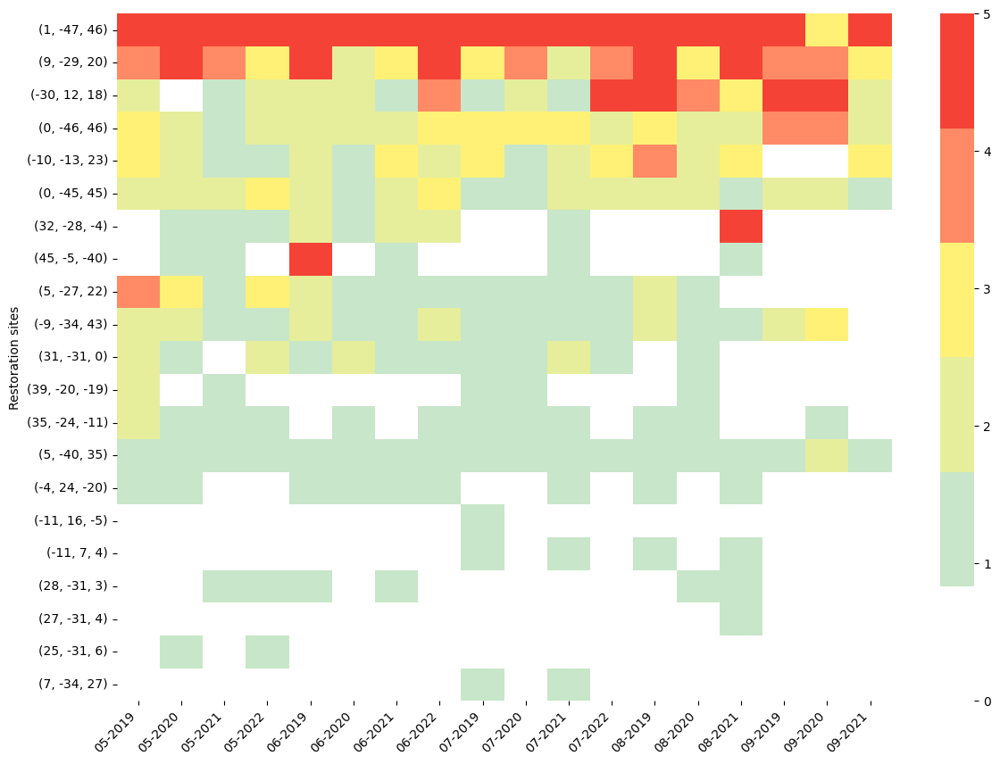

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the custom green to red color map with white for the 'None' category
category_colors = ['#ffffff', '#c8e6c9', '#e6ee9c', '#fff176', '#ff8a65', '#f44336']  # White for 0, green to red for categories
cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='rel_pathogen_concentration_category',
    aggfunc='first'  # Use 'first' to take the value directly since there is only one
)

# Calculate the mean value of 'rel_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

# Sort the DataFrame by these mean values in descending order
sorted_hex1 = mean_values.sort_values(ascending=False).index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_hex1]

# Create the heatmap
plt.figure(figsize=(14, 10))
ax = sns.heatmap(
    heatmap_data_categorical,
    cmap=cmap,
    vmin=0, vmax=5,  # Ensure the colorbar matches the categories
    cbar_kws={'label': '', 'ticks': [0, 1, 2, 3, 4, 5]}  # Adjust ticks to match categories
)

# Set custom labels for the x-axis
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_xlabel('')
ax.set_ylabel('Restoration sites')

# Customize colorbar labels
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1, 2, 3, 4, 5])
cbar.set_ticklabels('Very low', 'Low', 'Moderately low', 'Medium', 'Moderately high', 'High')  # Centered category labels
cbar.ax.tick_params(labelsize=10)  # Adjust size of colorbar tick labels

# Adjust the position and size of the colorbar
cbar.ax.set_position([0.92, 0.25, 0.03, 0.5])  # Adjust the position to make it smaller

# Remove y-axis ticks and labels
ax.set_yticks([])
ax.set_yticklabels([])

# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


### Diseased + aquaculture + historical to restoration AVERAGE 07-28

In [ ]:
dssaqchis_to_rst_01y = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0) | (ds_conn_28.his_count_hex0 > 0) | (ds_conn_28.aqc_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_28.rst_count_hex1 > 0)
)

dssaqchis_to_rst_01y

<xarray.DataArray 'obs_per_origin_area' (month: 5, year: 4, hex0: 365,
                                         hex1: 8397)> Size: 490MB
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * hex0       (hex0) <U14 20kB '(-1, -36, 37)' ... '(9, -59, 50)'
  * hex1       (hex1) <U14 470kB '(-1, -19, 20)' '(-1, -2, 3)' ... '(9, 9, -18)'
  * month      (month) float64 40B 0.0 1.0 2.0 3.0 4.0
  * year       (year) float64 32B 0.0 1.0 2.0 3.0
    lon_hex0   (hex0) float64 3kB -3.204 -3.2 -3.199 ... -1.252 -1.257 -1.262
    lon_hex1   (hex1) float64 67kB -3.216 -3.229 -3.215 ... -0.8121 -0.8032
    lat_hex0   (hex0) float64 3kB 48.82 47.72 47.57 53.49 ... 46.3 46.15 45.99
    lat_hex1   (hex1) float64 67kB 51.46 54.11 51.31 51.15 ... 56.27 56.43 56.58
    hex_label  (hex0) <U14 20kB '(-1, -36, 37)' ... '(9, -59, 50)'

In [ ]:
known_rst_sites = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()
known_rst_sites

,lon_hex0,lat_hex0,hex_label,rst_count_hex0
hex0,,,,
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",1.0
"(-11, 16, -5)",-5.652154,56.105601,"(-11, 16, -5)",2.0
"(-11, 7, 4)",-5.560333,54.706424,"(-11, 7, 4)",1.0
"(-14, -4, 18)",-6.110616,52.746676,"(-14, -4, 18)",1.0
"(-14, 0, 14)",-6.155950,53.368574,"(-14, 0, 14)",3.0
"(-14, 1, 13)",-6.167534,53.524029,"(-14, 1, 13)",1.0
"(-27, 6, 21)",-9.065311,53.176870,"(-27, 6, 21)",1.0
"(-30, 12, 18)",-9.847694,53.837064,"(-30, 12, 18)",1.0
"(-30, 8, 22)",-9.747894,53.217792,"(-30, 8, 22)",1.0


In [ ]:
dssaqchis_origins_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -36, 37)",-3.204015,48.815593,"(-1, -36, 37)",66.666667
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",27980.222222
"(-1, -6, 7)",-3.225977,53.488247,"(-1, -6, 7)",31.000000
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",32066.052632
"(-10, 13, -3)",-5.387340,55.721769,"(-10, 13, -3)",3924.526316
...,...,...,...,...
"(9, -35, 26)",-1.128520,49.735222,"(9, -35, 26)",3587.000000
"(9, -36, 27)",-1.134589,49.579428,"(9, -36, 27)",346.560000
"(9, -37, 28)",-1.140609,49.423620,"(9, -37, 28)",223.326923


In [ ]:
dssaqchis_destinations_01y = dssaqchis_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()
dssaqchis_destinations_01y

,lon_hex1,lat_hex1,obs_per_origin_area
hex1,,,
"(-1, -19, 20)",-3.215782,51.464504,0.0
"(-1, -2, 3)",-3.229353,54.110720,0.0
"(-1, -20, 21)",-3.215043,51.308774,0.0
"(-1, -21, 22)",-3.214311,51.153035,0.0
"(-1, -24, 25)",-3.212150,50.685757,0.0
...,...,...,...
"(9, 5, -14)",-0.838398,55.959362,0.0
"(9, 6, -15)",-0.829731,56.114857,0.0
"(9, 7, -16)",-0.820982,56.270351,0.0


In [ ]:
dssaqchis_origin_count_01y = (dssaqchis_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()
dssaqchis_origin_count_01y

,lon_hex1,lat_hex1,obs_per_origin_area
hex1,,,
"(-1, -19, 20)",-3.215782,51.464504,0
"(-1, -2, 3)",-3.229353,54.110720,0
"(-1, -20, 21)",-3.215043,51.308774,0
"(-1, -21, 22)",-3.214311,51.153035,0
"(-1, -24, 25)",-3.212150,50.685757,0
...,...,...,...
"(9, 5, -14)",-0.838398,55.959362,0
"(9, 6, -15)",-0.829731,56.114857,0
"(9, 7, -16)",-0.820982,56.270351,0


In [ ]:
dssaqchis_to_rst_stats = (
    dssaqchis_origin_count_01y
    .where(dssaqchis_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.join(
    dssaqchis_destinations_01y
    .where(dssaqchis_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dssaqchis_to_rst_stats["rel_pathogen_concentration"] /= dssaqchis_to_rst_stats["rel_pathogen_concentration"].max()

dssaqchis_to_rst_stats["rel_num_dss_sources"] = dssaqchis_to_rst_stats["num_dss_sources"] / dssaqchis_to_rst_stats["num_dss_sources"].max()

dssaqchis_to_rst_stats.where(dssaqchis_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,
"(7, -34, 27)",-1.544287,49.741493,32.0,0.387584,1.00000
"(25, -31, 6)",2.403683,51.492413,30.0,0.894476,0.93750
"(27, -31, 4)",2.854403,51.626277,22.0,1.000000,0.68750
"(-11, 7, 4)",-5.560333,54.706424,20.0,0.069391,0.62500
"(1, -47, 46)",-2.802199,47.255569,19.0,0.253768,0.59375
"(39, -20, -19)",5.967033,54.087844,19.0,0.524461,0.59375
"(0, -46, 46)",-3.000000,47.333794,18.0,0.054950,0.56250
"(5, -40, 35)",-1.983200,48.655073,17.0,0.013768,0.53125
"(-9, -34, 43)",-4.824256,48.488479,17.0,0.010666,0.53125


In [ ]:
dssaqchis_to_rst_stats.num_dss_sources.unique()

array([32., 30., 22., 20., 19., 18., 17., 16., 15., 14., 12., 10.,  9.,
        8.,  7.,  6.,  5.,  4.,  3.,  2.,  1.])

In [98]:
dssaqchis_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)
dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)

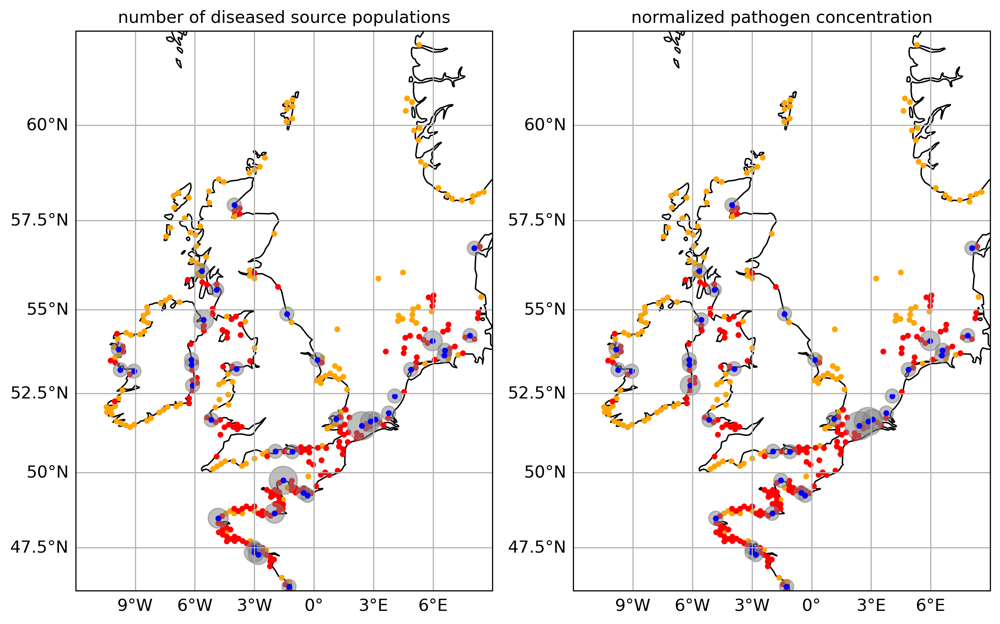

In [99]:
fig, ax = plt.subplots(
    1, 2,
    # subplot_kw={"projection": cartopy.crs.Stereographic(
    #     central_longitude=ds_conn.hex_proj__lon_origin,
    #     central_latitude=ds_conn.hex_proj__lat_origin,
    # )},
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

fig.patch.set_alpha(0.7)

_dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.copy()

_dssaqchis_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue",
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dssaqchis_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue",
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_dssaqchis_05m_07-28.pdf")

### Diseased to Restoration AVERAGE 07-28

In [ ]:
dss_to_rst_01y = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_28.rst_count_hex1 > 0)
)

dss_to_rst_01y

<xarray.DataArray 'obs_per_origin_area' (month: 5, year: 4, hex0: 66, hex1: 8397)> Size: 89MB
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * hex0       (hex0) <U14 4kB '(-1, -36, 37)' ... '(6, -40, 34)'
  * hex1       (hex1) <U14 470kB '(-1, -19, 20)' '(-1, -2, 3)' ... '(9, 9, -18)'
  * month      (month) float64 40B 0.0 1.0 2.0 3.0 4.0
  * year       (year) float64 32B 0.0 1.0 2.0 3.0
    lon_hex0   (hex0) float64 528B -3.204 -3.2 -3.199 ... -1.983 -1.762 -1.778
    lon_hex1   (hex1) float64 67kB -3.216 -3.229 -3.215 ... -0.8121 -0.8032
    lat_hex0   (hex0) float64 528B 48.82 47.72 47.57 51.68 ... 48.66 49.35 48.73
    lat_hex1   (hex1) float64 67kB 51.46 54.11 51.31 51.15 ... 56.27 56.43 56.58
    hex_label  (hex0) <U14 4kB '(-1, -36, 37)' ... '(6, -40, 34)'

In [ ]:
known_rst_sites = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()
known_rst_sites

,lon_hex0,lat_hex0,hex_label,rst_count_hex0
hex0,,,,
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",1.0
"(-11, 16, -5)",-5.652154,56.105601,"(-11, 16, -5)",2.0
"(-11, 7, 4)",-5.560333,54.706424,"(-11, 7, 4)",1.0
"(-14, -4, 18)",-6.110616,52.746676,"(-14, -4, 18)",1.0
"(-14, 0, 14)",-6.155950,53.368574,"(-14, 0, 14)",3.0
"(-14, 1, 13)",-6.167534,53.524029,"(-14, 1, 13)",1.0
"(-27, 6, 21)",-9.065311,53.176870,"(-27, 6, 21)",1.0
"(-30, 12, 18)",-9.847694,53.837064,"(-30, 12, 18)",1.0
"(-30, 8, 22)",-9.747894,53.217792,"(-30, 8, 22)",1.0


In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["month", "year", "hex1"]).compute().to_dataset().to_pandas()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
hex0,,,,
"(-1, -36, 37)",-3.204015,48.815593,"(-1, -36, 37)",66.666667
"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",27980.222222
"(-10, -13, 23)",-5.168404,51.677740,"(-10, -13, 23)",32066.052632
"(-11, 14, -3)",-5.631080,55.794692,"(-11, 14, -3)",2.095238
"(-11, 5, 6)",-5.540939,54.395456,"(-11, 5, 6)",636.473684
"(-2, -35, 37)",-3.408674,48.892978,"(-2, -35, 37)",118.581081
"(-2, -43, 45)",-3.398617,47.645165,"(-2, -43, 45)",19761.677419
"(-3, -35, 38)",-3.612033,48.814059,"(-3, -35, 38)",68.387097
"(-3, -42, 45)",-3.598835,47.722247,"(-3, -42, 45)",10106.984127


In [ ]:
dss_destinations_01y = dss_to_rst_01y.sum(["month", "year", "hex0"]).compute().to_dataset().to_pandas()
dss_destinations_01y

,lon_hex1,lat_hex1,obs_per_origin_area
hex1,,,
"(-1, -19, 20)",-3.215782,51.464504,0.0
"(-1, -2, 3)",-3.229353,54.110720,0.0
"(-1, -20, 21)",-3.215043,51.308774,0.0
"(-1, -21, 22)",-3.214311,51.153035,0.0
"(-1, -24, 25)",-3.212150,50.685757,0.0
...,...,...,...
"(9, 5, -14)",-0.838398,55.959362,0.0
"(9, 6, -15)",-0.829731,56.114857,0.0
"(9, 7, -16)",-0.820982,56.270351,0.0


In [ ]:
dss_origin_count_01y = (dss_to_rst_01y.sum(["month", "year"]) > 0).sum("hex0").compute().to_dataset().to_pandas()
dss_origin_count_01y

,lon_hex1,lat_hex1,obs_per_origin_area
hex1,,,
"(-1, -19, 20)",-3.215782,51.464504,0
"(-1, -2, 3)",-3.229353,54.110720,0
"(-1, -20, 21)",-3.215043,51.308774,0
"(-1, -21, 22)",-3.214311,51.153035,0
"(-1, -24, 25)",-3.212150,50.685757,0
...,...,...,...
"(9, 5, -14)",-0.838398,55.959362,0
"(9, 6, -15)",-0.829731,56.114857,0
"(9, 7, -16)",-0.820982,56.270351,0


In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dss_to_rst_stats["rel_pathogen_concentration"] /= dss_to_rst_stats["rel_pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
hex1,,,,,
"(-9, -34, 43)",-4.824256,48.488479,16.0,0.043610,1.0000
"(1, -47, 46)",-2.802199,47.255569,15.0,1.000000,0.9375
"(0, -46, 46)",-3.000000,47.333794,15.0,0.217101,0.9375
"(0, -45, 45)",-3.000000,47.489861,12.0,0.173371,0.7500
"(7, -34, 27)",-1.544287,49.741493,10.0,0.003567,0.6250
"(5, -40, 35)",-1.983200,48.655073,7.0,0.026424,0.4375
"(-30, 12, 18)",-9.847694,53.837064,2.0,0.284798,0.1250
"(-11, 7, 4)",-5.560333,54.706424,2.0,0.002320,0.1250
"(9, -29, 20)",-1.091058,50.669724,2.0,0.479451,0.1250


In [106]:
import pandas as pd

In [ ]:
dss_to_rst_stats.num_dss_sources.unique()

array([16., 15., 12., 10.,  7.,  2.,  1.])

In [108]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)
dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)

In [ ]:
dss_to_rst_stats

,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category
hex1,,,,,,,
"(-9, -34, 43)",-4.824256,48.488479,16.0,0.043610,1.0000,4.0,1.0
"(1, -47, 46)",-2.802199,47.255569,15.0,1.000000,0.9375,4.0,4.0
"(0, -46, 46)",-3.000000,47.333794,15.0,0.217101,0.9375,4.0,1.0
"(0, -45, 45)",-3.000000,47.489861,12.0,0.173371,0.7500,2.0,1.0
"(7, -34, 27)",-1.544287,49.741493,10.0,0.003567,0.6250,2.0,1.0
"(5, -40, 35)",-1.983200,48.655073,7.0,0.026424,0.4375,1.0,1.0
"(-30, 12, 18)",-9.847694,53.837064,2.0,0.284798,0.1250,1.0,1.0
"(-11, 7, 4)",-5.560333,54.706424,2.0,0.002320,0.1250,1.0,1.0
"(9, -29, 20)",-1.091058,50.669724,2.0,0.479451,0.1250,1.0,1.0


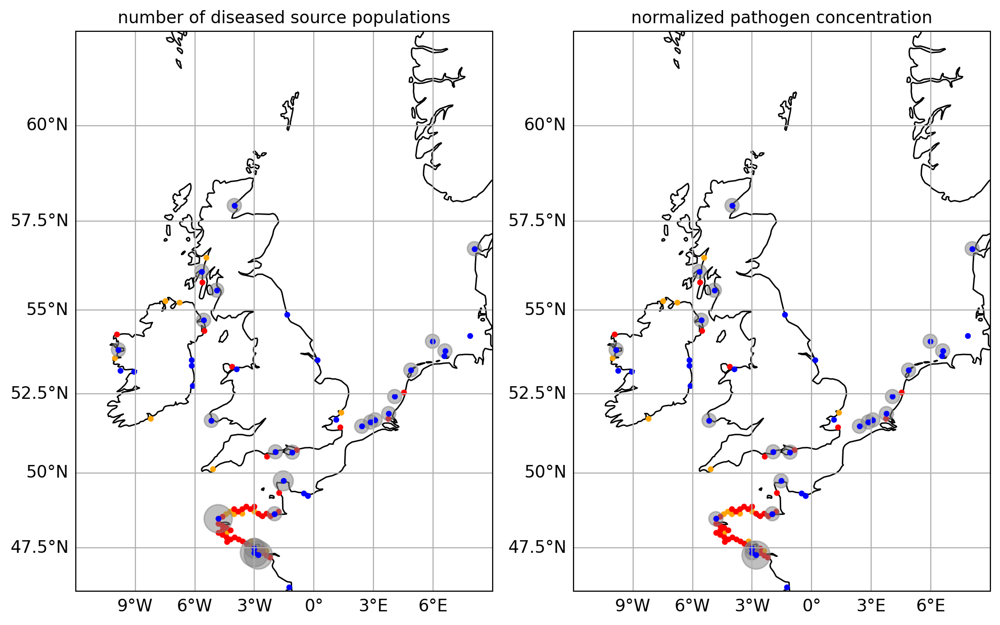

In [110]:
fig, ax = plt.subplots(
    1, 2,
    # subplot_kw={"projection": cartopy.crs.Stereographic(
    #     central_longitude=ds_conn.hex_proj__lon_origin,
    #     central_latitude=ds_conn.hex_proj__lat_origin,
    # )},
    subplot_kw={"projection": cartopy.crs.Mercator()},
    figsize=(10, 6.26),
)

fig.set_dpi(200)

fig.patch.set_alpha(0.7)

_dss_to_rst_stats = dss_to_rst_stats.copy()

_dss_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dss_to_rst_stats["rel_pathogen_concentration_category"] *= 100

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

ax[0].coastlines(zorder=0)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 62])
gl1 = ax[0].gridlines(draw_labels=True)
gl1.xlabel_style = {'size': 12}
gl1.ylabel_style = {'size': 12}
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", 
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

ax[1].coastlines(zorder=0)

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 62])
gl2 = ax[1].gridlines(draw_labels=True)
gl2.xlabel_style = {'size': 12}
gl2.ylabel_style = {'size': 12}
gl2.top_labels=False   # suppress top labels
gl2.right_labels=False # suppress right labels;

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_05m_07-28.pdf")

### Diseased to restoration VARIABILITY 07-28

In [111]:
dss_to_rst_01y = ds_conn_28.obs_per_origin_area.where(
    (ds_conn_28.dss_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn_28.rst_count_hex1 > 0)
)

In [112]:
known_rst_sites = ds_conn_28.rst_count_hex0.where(ds_conn_28.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()

In [ ]:
dss_origins_01y = dss_to_rst_01y.sum(["hex1"]).compute().to_dataframe()
dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).dropna()

lon_hex0   lat_hex0       hex_label  \
month year hex0                                                  
0.0   0.0  (-1, -44, 45)  -3.199006  47.567702   (-1, -44, 45)   
           (-10, -13, 23) -5.168404  51.677740  (-10, -13, 23)   
           (-11, 5, 6)    -5.540939  54.395456     (-11, 5, 6)   
           (-2, -43, 45)  -3.398617  47.645165   (-2, -43, 45)   
           (-3, -42, 45)  -3.598835  47.722247   (-3, -42, 45)   
...                             ...        ...             ...   
4.0   2.0  (10, -29, 19)  -0.875500  50.743765   (10, -29, 19)   
           (2, -46, 44)   -2.602597  47.489117    (2, -46, 44)   
           (2, -47, 45)   -2.603801  47.333052    (2, -47, 45)   
           (3, -39, 36)   -2.389897  48.658131    (3, -39, 36)   
           (6, -40, 34)   -1.777946  48.730928    (6, -40, 34)   

                           obs_per_origin_area  
month year hex0                                 
0.0   0.0  (-1, -44, 45)           1523.851852  
           (-10, -13, 23)          1544.684211  
           (-11, 5, 6)                6.868421  
           (-2, -43, 45)           2113.548387  
           (-3, -42, 45)           2940.555556  
...                                        ...  
4.0   2.0  (10, -29, 19)            645.489362  
           (2, -46, 44)            1507.347826  
           (2, -47, 45)             379.422535  
           (3, -39, 36)              33.488372  
           (6, -40, 34)              27.729730  

[487 rows x 4 columns]

In [114]:
dss_destinations_01y = dss_to_rst_01y.sum("hex0").compute().to_dataframe()

In [115]:
dss_origin_count_01y = (dss_to_rst_01y > 0).sum("hex0").compute().to_dataframe()

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dss_to_rst_stats["rel_pathogen_concentration"] /= dss_to_rst_stats["rel_pathogen_concentration"].max()

dss_to_rst_stats["rel_num_dss_sources"] = dss_to_rst_stats["num_dss_sources"] / dss_to_rst_stats["num_dss_sources"].max()

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

lon        lat  num_dss_sources  \
month year hex1                                                   
3.0   1.0  (1, -47, 46)   -2.802199  47.255569             14.0   
1.0   1.0  (1, -47, 46)   -2.802199  47.255569             14.0   
2.0   2.0  (1, -47, 46)   -2.802199  47.255569             14.0   
3.0   1.0  (0, -46, 46)   -3.000000  47.333794             13.0   
2.0   2.0  (0, -46, 46)   -3.000000  47.333794             13.0   
...                             ...        ...              ...   
1.0   3.0  (35, -24, -11)  4.878878  53.225639              1.0   
           (45, -5, -40)   8.080625  56.741595              1.0   
           (5, -27, 22)   -1.939319  50.680946              1.0   
           (9, -29, 20)   -1.091058  50.669724              1.0   
      2.0  (7, -34, 27)   -1.544287  49.741493              1.0   

                           rel_pathogen_concentration  rel_num_dss_sources  
month year hex1                                                             
3.0   1.0  (1, -47, 46)                      0.613529             1.000000  
1.0   1.0  (1, -47, 46)                      1.000000             1.000000  
2.0   2.0  (1, -47, 46)                      0.562931             1.000000  
3.0   1.0  (0, -46, 46)                      0.104219             0.928571  
2.0   2.0  (0, -46, 46)                      0.182671             0.928571  
...                                               ...                  ...  
1.0   3.0  (35, -24, -11)                    0.000445             0.071429  
           (45, -5, -40)                     0.014731             0.071429  
           (5, -27, 22)                      0.015681             0.071429  
           (9, -29, 20)                      0.509678             0.071429  
      2.0  (7, -34, 27)                      0.002183             0.071429  

[260 rows x 5 columns]

In [ ]:
dss_to_rst_stats = (
    dss_origin_count_01y
    .where(dss_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dss_to_rst_stats = dss_to_rst_stats.join(
    dss_destinations_01y
    .where(dss_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

#note that hear we have to first group by month and year to calculate relative values within the respective monthxyear combination
dss_to_rst_stats["rel_pathogen_concentration"] = (
    dss_to_rst_stats.groupby(["month", "year"])["rel_pathogen_concentration"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats["rel_num_dss_sources"] = (
    dss_to_rst_stats.groupby(["month", "year"])["num_dss_sources"]
    .transform(lambda x: x / x.max())
)

dss_to_rst_stats.where(dss_to_rst_stats.rel_pathogen_concentration > 0).dropna()

lon        lat  num_dss_sources  \
month year hex1                                                   
3.0   1.0  (1, -47, 46)   -2.802199  47.255569             14.0   
1.0   1.0  (1, -47, 46)   -2.802199  47.255569             14.0   
2.0   2.0  (1, -47, 46)   -2.802199  47.255569             14.0   
3.0   1.0  (0, -46, 46)   -3.000000  47.333794             13.0   
2.0   2.0  (0, -46, 46)   -3.000000  47.333794             13.0   
...                             ...        ...              ...   
1.0   3.0  (35, -24, -11)  4.878878  53.225639              1.0   
           (45, -5, -40)   8.080625  56.741595              1.0   
           (5, -27, 22)   -1.939319  50.680946              1.0   
           (9, -29, 20)   -1.091058  50.669724              1.0   
      2.0  (7, -34, 27)   -1.544287  49.741493              1.0   

                           rel_pathogen_concentration  rel_num_dss_sources  
month year hex1                                                             
3.0   1.0  (1, -47, 46)                      1.000000             1.000000  
1.0   1.0  (1, -47, 46)                      1.000000             1.000000  
2.0   2.0  (1, -47, 46)                      1.000000             1.000000  
3.0   1.0  (0, -46, 46)                      0.169868             0.928571  
2.0   2.0  (0, -46, 46)                      0.324499             0.928571  
...                                               ...                  ...  
1.0   3.0  (35, -24, -11)                    0.000812             0.083333  
           (45, -5, -40)                     0.026890             0.083333  
           (5, -27, 22)                      0.028625             0.083333  
           (9, -29, 20)                      0.930377             0.083333  
      2.0  (7, -34, 27)                      0.003200             0.100000  

[260 rows x 5 columns]

In [118]:
dss_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dss_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/5, 2/5, 3/5, 4/5, 1],
    labels=[1, 2, 3, 4, 5],
).astype(float)

dss_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dss_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 0.1, 0.25, 0.5, 0.75, 1],
    labels=[1, 2, 3, 4, 5],
).astype(float)

In [119]:
# Reset the index to make 'month', 'year', and 'hex1' regular columns
dss_to_rst_stats = dss_to_rst_stats.reset_index()

In [120]:
# Define mappings for month and year
month_mapping = {0: '05', 1: '06', 2: '07', 3: '08', 4: '09'}
year_mapping = {0: '2019', 1: '2020', 2: '2021', 3: '2022'}

# Replace numerical month and year with corresponding names
dss_to_rst_stats['month'] = dss_to_rst_stats['month'].map(month_mapping)
dss_to_rst_stats['year'] = dss_to_rst_stats['year'].map(year_mapping)


In [121]:
dss_to_rst_stats['month_year'] = dss_to_rst_stats['month'] + '-' + dss_to_rst_stats['year']

In [ ]:
# Get the count of each category in rel_pathogen_concentration_category
category_counts = dss_to_rst_stats['rel_pathogen_concentration_category'].value_counts()

print(category_counts)

unique_hex1_count = dss_to_rst_stats['hex1'].nunique()
print(unique_hex1_count)


rel_pathogen_concentration_category
1.0    156
2.0     52
5.0     25
3.0     18
4.0      9
Name: count, dtype: int64
23


TypeError: Colorbar.set_ticklabels() takes 2 positional arguments but 7 were given

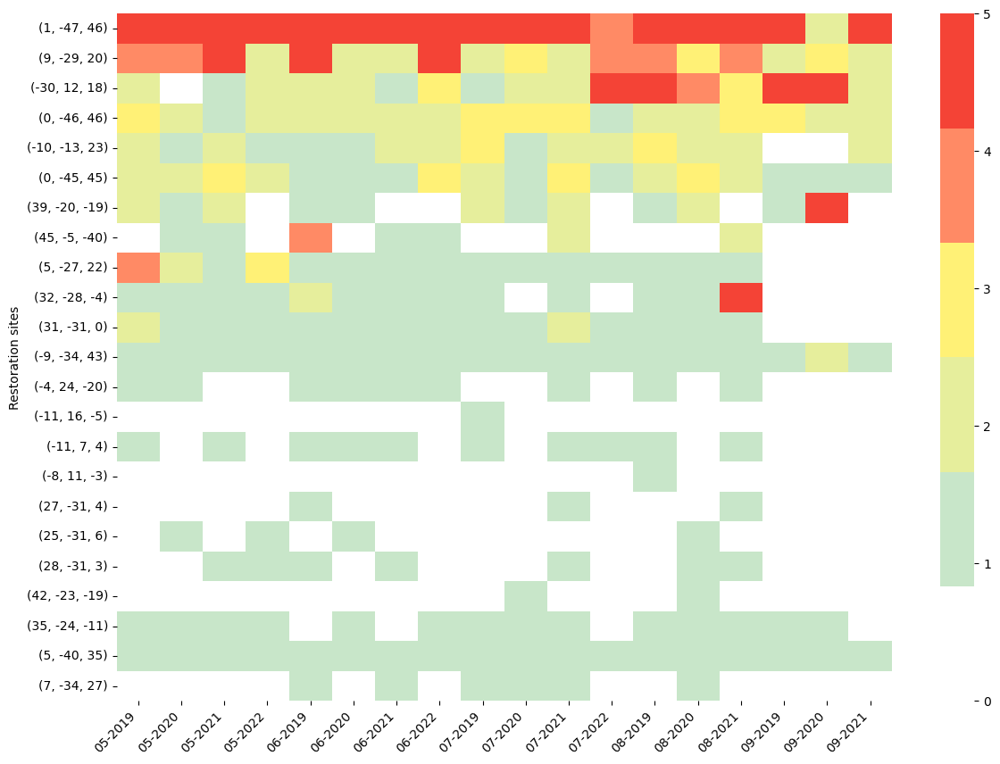

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the custom green to red color map with white for the 'None' category
category_colors = ['#ffffff', '#c8e6c9', '#e6ee9c', '#fff176', '#ff8a65', '#f44336']  # White for 0, green to red for categories
cmap = sns.color_palette(category_colors, as_cmap=True)

# Pivot the table to get the heatmap data
heatmap_data_categorical = dss_to_rst_stats.pivot_table(
    index='hex1', 
    columns='month_year', 
    values='rel_pathogen_concentration_category',
    aggfunc='first'  # Use 'first' to take the value directly since there is only one
)

# Calculate the mean value of 'rel_pathogen_concentration_category' for each 'hex1'
mean_values = heatmap_data_categorical.mean(axis=1)

# Sort the DataFrame by these mean values in descending order
sorted_hex1 = mean_values.sort_values(ascending=False).index
heatmap_data_categorical = heatmap_data_categorical.loc[sorted_hex1]

# Create the heatmap
plt.figure(figsize=(14, 10))
ax = sns.heatmap(
    heatmap_data_categorical,
    cmap=cmap,
    vmin=0, vmax=5,  # Ensure the colorbar matches the categories
    cbar_kws={'label': '', 'ticks': [0, 1, 2, 3, 4, 5]}  # Adjust ticks to match categories
)

# Set custom labels for the x-axis
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_xlabel('')
ax.set_ylabel('Restoration sites')

# Customize colorbar labels
cbar = ax.collections[0].colorbar
cbar.set_ticks([0, 1, 2, 3, 4, 5])
cbar.set_ticklabels('Very low', 'Low', 'Moderately low', 'Medium', 'Moderately high', 'High')  # Centered category labels
cbar.ax.tick_params(labelsize=10)  # Adjust size of colorbar tick labels

# Adjust the position and size of the colorbar
cbar.ax.set_position([0.92, 0.25, 0.03, 0.5])  # Adjust the position to make it smaller

# Remove y-axis ticks and labels
ax.set_yticks([])
ax.set_yticklabels([])

# Save the figure
#plt.savefig("plots/042_risk_heatmap_dss.pdf")

# Show the plot
plt.show()


### Diseased + aquaculture + historical to restoration PER MONTH AND YEAR

In [ ]:
dssaqchis_to_rst_01y = ds_conn.obs_per_origin_area.where(
    (ds_conn.dss_count_hex0 > 0) | (ds_conn.his_count_hex0 > 0) | (ds_conn.aqc_count_hex0 > 0),
    drop=True,
).where(
    (ds_conn.rst_count_hex1 > 0)
)

dssaqchis_to_rst_01y

NameError: name 'ds_conn' is not defined

In [ ]:
year_name_mapping = {
    0: '2019',
    1: '2020',
    2: '2021',
    3: '2022',
}

month_name_mapping = {
    0: 'May',
    1: 'June',
    2: 'July',
    3: 'August',
    4: 'September',
}

# Apply the mappings to the xarray dataset
dssaqchis_to_rst_01y['year'] = [year_name_mapping.get(y, y) for y in dssaqchis_to_rst_01y['year'].values]
dssaqchis_to_rst_01y['month'] = [month_name_mapping.get(m, m) for m in dssaqchis_to_rst_01y['month'].values]

# Print the updated xarray dataset
dssaqchis_to_rst_01y

<xarray.DataArray 'obs_per_origin_area' (month: 5, year: 4, hex0: 365,
                                         hex1: 8401)> Size: 491MB
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]])
Coordinates:
  * hex0       (hex0) <U47 69kB '(-1, -36, 37)' ... '(9, -59, 50)'
  * hex1       (hex1) <U47 2MB '(-1, -19, 20)' '(-1, -2, 3)' ... '(9, 9, -18)'
    lon_hex0   (hex0) float64 3kB -3.204 -3.2 -3.199 ... -1.252 -1.257 -1.262
    lon_hex1   (hex1) float64 67kB -3.216 -3.229 -3.215 ... -0.8121 -0.8032
    lat_hex0   (hex0) float64 3kB 48.82 47.72 47.57 53.49 ... 46.3 46.15 45.99
    lat_hex1   (hex1) float64 67kB 51.46 54.11 51.31 51.15 ... 56.27 56.43 56.58
    hex_label  (hex0) <U14 20kB '(-1, -36, 37)' ... '(9, -59, 50)'
  * year       (year) <U4 64B '2019' '2020' '2021' '2022'
  * month      (month) <U9 180B 'May' 'June' 'July' 'August' 'September'

In [ ]:
known_rst_sites = ds_conn.rst_count_hex0.where(ds_conn.rst_count_hex0 > 0).to_dataset().to_pandas().dropna()
known_rst_sites

NameError: name 'ds_conn' is not defined

In [ ]:
dssaqchis_origins_01y = dssaqchis_to_rst_01y.sum(["hex1"]).compute().to_dataframe().reset_index(level=['year', 'month','hex0'])
dssaqchis_origins_01y.where(dssaqchis_origins_01y["obs_per_origin_area"] > 0).dropna()

,month,year,hex0,lon_hex0,lat_hex0,hex_label,obs_per_origin_area
2,May,2019,"(-1, -44, 45)",-3.199006,47.567702,"(-1, -44, 45)",249.407407
9,May,2019,"(-10, 13, -3)",-5.387340,55.721769,"(-10, 13, -3)",399.473684
18,May,2019,"(-11, 6, 5)",-5.550592,54.550942,"(-11, 6, 5)",20.096774
19,May,2019,"(-11, 7, 4)",-5.560333,54.706424,"(-11, 7, 4)",179.186667
24,May,2019,"(-13, -3, 16)",-5.904284,52.985637,"(-13, -3, 16)",980.962963
...,...,...,...,...,...,...,...
6912,September,2021,"(6, -39, 33)",-1.774072,48.886829,"(6, -39, 33)",30.000000
6913,September,2021,"(6, -40, 34)",-1.777946,48.730928,"(6, -40, 34)",7.189189
6917,September,2021,"(7, -28, 21)",-1.515141,50.676136,"(7, -28, 21)",79.000000
6918,September,2021,"(7, -34, 27)",-1.544287,49.741493,"(7, -34, 27)",828.236842


In [ ]:
dssaqchis_origin_count_01y = (dssaqchis_to_rst_01y > 0).sum("hex0").compute().to_dataframe().reset_index(level=['year', 'month','hex1']) #origins per hex1
dssaqchis_origin_count_01y

,month,year,hex1,lon_hex1,lat_hex1,obs_per_origin_area
0,May,2019,"(-1, -19, 20)",-3.215782,51.464504,0
1,May,2019,"(-1, -2, 3)",-3.229353,54.110720,0
2,May,2019,"(-1, -20, 21)",-3.215043,51.308774,0
3,May,2019,"(-1, -21, 22)",-3.214311,51.153035,0
4,May,2019,"(-1, -24, 25)",-3.212150,50.685757,0
...,...,...,...,...,...,...
168015,September,2022,"(9, 5, -14)",-0.838398,55.959362,0
168016,September,2022,"(9, 6, -15)",-0.829731,56.114857,0
168017,September,2022,"(9, 7, -16)",-0.820982,56.270351,0
168018,September,2022,"(9, 8, -17)",-0.812150,56.425843,0


In [ ]:
dssaqchis_destinations_01y = dssaqchis_to_rst_01y.sum(["hex0"]).compute().to_dataframe().reset_index(level=['year', 'month','hex1'])
dssaqchis_destinations_01y

,month,year,hex1,lon_hex1,lat_hex1,obs_per_origin_area
0,May,2019,"(-1, -19, 20)",-3.215782,51.464504,0.0
1,May,2019,"(-1, -2, 3)",-3.229353,54.110720,0.0
2,May,2019,"(-1, -20, 21)",-3.215043,51.308774,0.0
3,May,2019,"(-1, -21, 22)",-3.214311,51.153035,0.0
4,May,2019,"(-1, -24, 25)",-3.212150,50.685757,0.0
...,...,...,...,...,...,...
168015,September,2022,"(9, 5, -14)",-0.838398,55.959362,0.0
168016,September,2022,"(9, 6, -15)",-0.829731,56.114857,0.0
168017,September,2022,"(9, 7, -16)",-0.820982,56.270351,0.0
168018,September,2022,"(9, 8, -17)",-0.812150,56.425843,0.0


In [ ]:
dssaqchis_to_rst_stats = (
    dssaqchis_origin_count_01y
    .where(dssaqchis_origin_count_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"lon_hex1": "lon", "lat_hex1": "lat", "obs_per_origin_area": "num_dss_sources"})
)

dssaqchis_to_rst_stats = dssaqchis_to_rst_stats.join(
    dssaqchis_destinations_01y
    .where(dssaqchis_destinations_01y["obs_per_origin_area"] > 0).dropna()
    .sort_values("obs_per_origin_area", ascending=False)
    .rename(columns={"obs_per_origin_area": "rel_pathogen_concentration"})
    [["rel_pathogen_concentration"]]
)

dssaqchis_to_rst_stats

,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration
16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,10410.696700
117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,9881.513391
15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,47172.742099
15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,29776.015017
91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,43259.506897
...,...,...,...,...,...,...,...
66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,6.176471
66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,34.075472
62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,14.622222
89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,2.000000


In [ ]:
dssaqchis_to_rst_stats["rel_pathogen_concentration"] /= (
    dssaqchis_to_rst_stats.groupby(['year', 'month'])["rel_pathogen_concentration"]
    .transform('max')
)
dssaqchis_to_rst_stats

,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration
16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,0.220693
117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,0.220858
15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,1.000000
15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,0.631212
91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,1.000000
...,...,...,...,...,...,...,...
66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,0.000181
66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,0.000996
62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,0.000427
89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,0.000046


In [ ]:
dssaqchis_to_rst_stats["rel_num_dss_sources"] = dssaqchis_to_rst_stats["num_dss_sources"] / (
    dssaqchis_to_rst_stats.groupby(['year', 'month'])["num_dss_sources"]
    .transform('max')
)
dssaqchis_to_rst_stats

,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,0.220693,1.000000
117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,0.220858,1.000000
15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,1.000000,0.846154
15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,0.631212,0.846154
91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...
66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,0.000181,0.125000
66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,0.000996,0.125000
62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,0.000427,0.125000
89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,0.000046,0.100000


In [ ]:
dssaqchis_to_rst_stats.where(dssaqchis_to_rst_stats.rel_pathogen_concentration > 0).dropna()

,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources
16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,0.220693,1.000000
117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,0.220858,1.000000
15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,1.000000,0.846154
15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,0.631212,0.846154
91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...
66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,0.000181,0.125000
66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,0.000996,0.125000
62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,0.000427,0.125000
89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,0.000046,0.100000


In [ ]:
dssaqchis_to_rst_stats.num_dss_sources.unique()

array([13., 11., 10.,  9.,  8.,  7.,  6.,  5.,  4.,  3.,  2.,  1.])

In [ ]:
dssaqchis_to_rst_stats["rel_num_dss_sources_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_num_dss_sources,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)
dssaqchis_to_rst_stats["rel_pathogen_concentration_category"] = pd.cut(
    dssaqchis_to_rst_stats.rel_pathogen_concentration,
    bins=[0, 1/2, 3/4, 1],
    labels=[1, 2, 4],
).astype(float)

dssaqchis_to_rst_stats

,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category
16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,0.220693,1.000000,4.0,4.0
117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,0.220858,1.000000,4.0,4.0
15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,1.000000,0.846154,4.0,4.0
15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,0.631212,0.846154,4.0,4.0
91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,1.000000,1.000000,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...
66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,0.000181,0.125000,1.0,1.0
66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,0.000996,0.125000,1.0,1.0
62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,0.000427,0.125000,1.0,1.0
89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,0.000046,0.100000,1.0,1.0


In [ ]:
dssaqchis_to_rst_stats_reset = dssaqchis_to_rst_stats.reset_index()
dssaqchis_to_rst_stats_reset

,index,month,year,hex1,lon,lat,num_dss_sources,rel_pathogen_concentration,rel_num_dss_sources,rel_num_dss_sources_category,rel_pathogen_concentration_category
0,16611,May,2020,"(7, -34, 27)",-1.544287,49.741493,13.0,0.220693,1.000000,4.0,4.0
1,117423,August,2020,"(7, -34, 27)",-1.544287,49.741493,11.0,0.220858,1.000000,4.0,4.0
2,15395,May,2020,"(27, -31, 4)",2.854403,51.626277,11.0,1.000000,0.846154,4.0,4.0
3,15471,May,2020,"(28, -31, 3)",3.080785,51.692529,11.0,0.631212,0.846154,4.0,4.0
4,91004,July,2021,"(27, -31, 4)",2.854403,51.626277,10.0,1.000000,1.000000,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
393,66351,June,2022,"(35, -24, -11)",4.878878,53.225639,1.0,0.000181,0.125000,1.0,1.0
394,66209,June,2022,"(32, -31, -1)",3.993107,51.952949,1.0,0.000996,0.125000,1.0,1.0
395,62012,June,2022,"(-4, 24, -20)",-4.011904,57.918896,1.0,0.000427,0.125000,1.0,1.0
396,89931,July,2021,"(14, -13, -1)",0.167534,53.524029,1.0,0.000046,0.100000,1.0,1.0


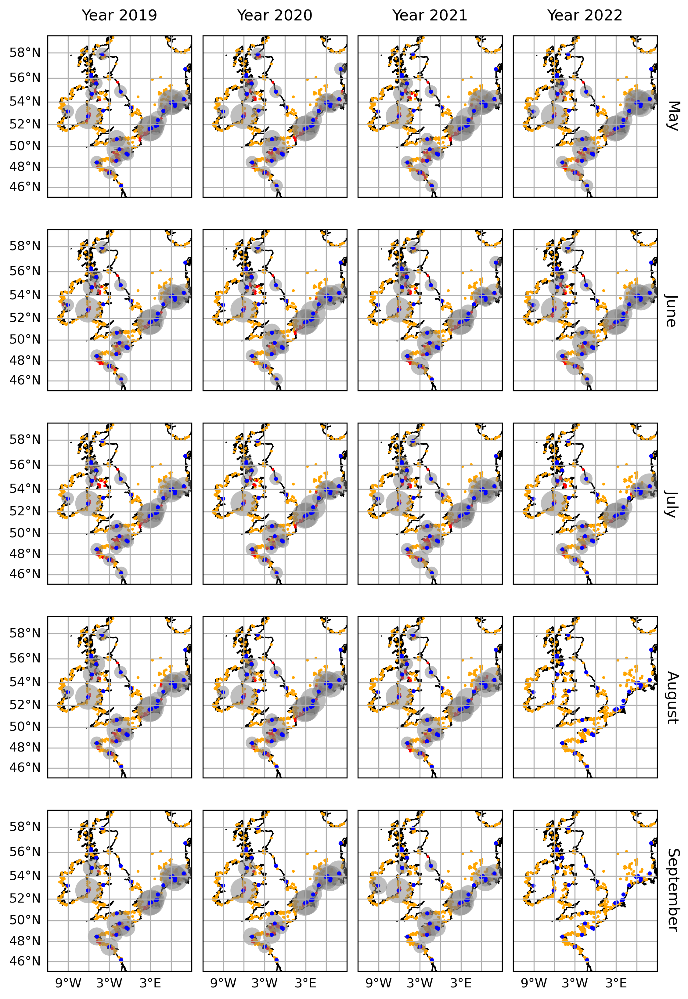

In [68]:
years = ['2019','2020','2021','2022']
months = ['May','June','July','August','September']
num_years = len(years)
num_months = len(months)
fig, axes = plt.subplots(num_months, num_years, 
                         subplot_kw={"projection": cartopy.crs.Mercator()}, 
                         figsize=(10, 14))

fig.set_dpi(300)

fig.patch.set_alpha(0.7)

#loop to make plots for each year and month
for i, year in enumerate(years):
    for j, month in enumerate(months):
        ax = axes [j,i]
        
        ax.coastlines(zorder=0)

        #subset to only plot relative risk for each month&year
        subset = dssaqchis_to_rst_stats_reset[(dssaqchis_to_rst_stats_reset['year'] == year) & (dssaqchis_to_rst_stats_reset['month'] == month)].copy()
        
        subset["rel_pathogen_concentration_category"] *= 100
        
        
        #subset to only plot relevant sources for each month&year
        origin_subset = dssaqchis_origins_01y[(dssaqchis_origins_01y['year'] == year) & (dssaqchis_origins_01y['month'] == month)].copy()

        origin_subset.where(origin_subset["obs_per_origin_area"] == 0).plot.scatter(
            x="lon_hex0", y="lat_hex0", s=1.5, color="orange",
            ax=ax, transform=cartopy.crs.PlateCarree(),
        )

        origin_subset.where(origin_subset["obs_per_origin_area"] > 0).plot.scatter(
            x="lon_hex0", y="lat_hex0", s=1.5, color="red", 
            ax=ax, transform=cartopy.crs.PlateCarree(),
        )

        subset.plot.scatter(
            x="lon", y="lat", s="rel_pathogen_concentration_category",
            alpha=0.5, color="gray", edgecolor='none', 
            ax=ax, transform=cartopy.crs.PlateCarree(),
        )
        
        #add restoration site locations
        known_rst_sites.plot.scatter(
            x="lon_hex0", y="lat_hex0", s=5, 
            color="blue", 
            ax=ax, transform=cartopy.crs.PlateCarree()
        )
        
        #add axes and labels
        ax.set_extent([-12, 9, 45, 59])
        gl = ax.gridlines(draw_labels=False, zorder=0)
        
        if j == num_months - 1 and month == 'September':
            gl.bottom_labels=True
            gl.top_labels=False
            gl.right_labels=False
        else:
            gl.bottom_labels=False
            gl.top_labels=False
            gl.right_labels=False
            
        # Add y-axis labels only to the leftmost column for 2019
        if i == 0 and year == '2019':
            gl.top_labels=False
            gl.right_labels=False
            gl.left_labels=True
        else:
            gl.top_labels=False
            gl.right_labels=False
            gl.left_labels=False

plt.subplots_adjust(right=0.8, bottom=0.15, wspace=0.02) # Adjust the subplot layout
        
#add year and month labels
for i, year in enumerate(years):
    axes[0, i].set_title(f'Year {int(year)}', pad=12, size = 12)
    
for j, month in enumerate(months):
    axes[j, -1].annotate(f'{month}', xy=(1.05, 0.5), xycoords='axes fraction', rotation=270, fontsize=12, ha='left', va='center')
    
#fig.tight_layout();

#save
fig.savefig("plots/041_rest-sites_risk-analsysis_dssaqchis_permonth.pdf")

### Add ocean current vectors to plot

In [22]:
import xarray as xr
import matplotlib.pyplot as plt
#from mpl_toolkits.basemap import Basemap
import numpy as np

import xarray as xr
import numpy as np
#import cmocean
from pathlib import Path
from matplotlib import pyplot as plt

In [23]:
#parameters

current_data_path = (
    "/gxfs_work/geomar/smomw529/2022_north-sea_oysters/"
    "data/ocean/MetO-NWS-PHY-hi-CUR/"
)

In [ ]:
data_files = sorted(Path(current_data_path).glob("2021/0[5,6,7,8,9]/*.nc"))
print(f"found {len(data_files)} data files")

found 153 data files


In [ ]:
%%time

dataset = xr.open_mfdataset(data_files, chunks={"depth": 1, "time": 24})
dataset

CPU times: user 1.15 s, sys: 471 ms, total: 1.62 s
Wall time: 34.3 s


<xarray.Dataset>
Dimensions:  (time: 3672, lat: 1240, lon: 958, depth: 33)
Coordinates:
  * time     (time) datetime64[ns] 2021-05-01T01:00:00 ... 2021-10-01
  * lat      (lat) float32 46.0 46.01 46.03 46.04 ... 62.7 62.72 62.73 62.74
  * lon      (lon) float32 -16.0 -15.97 -15.94 -15.91 ... 12.91 12.94 12.97 13.0
  * depth    (depth) float32 0.0 3.0 5.0 10.0 15.0 ... 2e+03 3e+03 4e+03 5e+03
Data variables:
    uo       (time, depth, lat, lon) float32 dask.array<chunksize=(24, 1, 1240, 958), meta=np.ndarray>
    vo       (time, depth, lat, lon) float32 dask.array<chunksize=(24, 1, 1240, 958), meta=np.ndarray>
Attributes: (12/13)
    title:                hourly-instantaneous horizontal velocity (3D)
    Conventions:          CF-1.7
    source:               PS-OS 45, AMM-FOAM 1.5 km (tidal) NEMO v3.6_WAVEWAT...
    contact:              servicedesk.cmems@mercator-ocean.eu
    netcdf-version-id:    netCDF-4
    references:           http://marine.copernicus.eu/
    ...                   ...
    institution:          UK Met Office
    history:              See source and creation_date attributes
    forcing_data_source:  ECMWF Global Atmospheric Model (HRES); CMEMS-MERCAT...
    product:              NORTHWESTSHELF_ANALYSIS_FORECAST_PHY_004_013
    credit:               E.U. Copernicus Marine Service Information (CMEMS)
    licence:              http://marine.copernicus.eu/services-portfolio/serv...

In [ ]:
#select relevant months may-sept for one example year 2021 to later calculate and plot the average
subset = dataset.isel(depth=4).sel(time=dataset['time'].dt.strftime('%Y-%m').isin(['2021-05', '2021-06', '2021-07', '2021-08', '2021-09']))
#subset = dataset.isel(depth=4).sel(time=dataset['time'].dt.strftime('%Y-%m').isin(['2021-05']))
subset

<xarray.Dataset>
Dimensions:  (time: 3671, lat: 1240, lon: 958)
Coordinates:
  * time     (time) datetime64[ns] 2021-05-01T01:00:00 ... 2021-09-30T23:00:00
  * lat      (lat) float32 46.0 46.01 46.03 46.04 ... 62.7 62.72 62.73 62.74
  * lon      (lon) float32 -16.0 -15.97 -15.94 -15.91 ... 12.91 12.94 12.97 13.0
    depth    float32 15.0
Data variables:
    uo       (time, lat, lon) float32 dask.array<chunksize=(24, 1240, 958), meta=np.ndarray>
    vo       (time, lat, lon) float32 dask.array<chunksize=(24, 1240, 958), meta=np.ndarray>
Attributes: (12/13)
    title:                hourly-instantaneous horizontal velocity (3D)
    Conventions:          CF-1.7
    source:               PS-OS 45, AMM-FOAM 1.5 km (tidal) NEMO v3.6_WAVEWAT...
    contact:              servicedesk.cmems@mercator-ocean.eu
    netcdf-version-id:    netCDF-4
    references:           http://marine.copernicus.eu/
    ...                   ...
    institution:          UK Met Office
    history:              See source and creation_date attributes
    forcing_data_source:  ECMWF Global Atmospheric Model (HRES); CMEMS-MERCAT...
    product:              NORTHWESTSHELF_ANALYSIS_FORECAST_PHY_004_013
    credit:               E.U. Copernicus Marine Service Information (CMEMS)
    licence:              http://marine.copernicus.eu/services-portfolio/serv...

In [ ]:
subset_day = dataset.isel(depth=4).sel(time='2021-07-01', method = 'nearest')
subset_day

<xarray.Dataset>
Dimensions:  (lat: 1240, lon: 958)
Coordinates:
    time     datetime64[ns] 2021-07-01
  * lat      (lat) float32 46.0 46.01 46.03 46.04 ... 62.7 62.72 62.73 62.74
  * lon      (lon) float32 -16.0 -15.97 -15.94 -15.91 ... 12.91 12.94 12.97 13.0
    depth    float32 15.0
Data variables:
    uo       (lat, lon) float32 dask.array<chunksize=(1240, 958), meta=np.ndarray>
    vo       (lat, lon) float32 dask.array<chunksize=(1240, 958), meta=np.ndarray>
Attributes: (12/13)
    title:                hourly-instantaneous horizontal velocity (3D)
    Conventions:          CF-1.7
    source:               PS-OS 45, AMM-FOAM 1.5 km (tidal) NEMO v3.6_WAVEWAT...
    contact:              servicedesk.cmems@mercator-ocean.eu
    netcdf-version-id:    netCDF-4
    references:           http://marine.copernicus.eu/
    ...                   ...
    institution:          UK Met Office
    history:              See source and creation_date attributes
    forcing_data_source:  ECMWF Global Atmospheric Model (HRES); CMEMS-MERCAT...
    product:              NORTHWESTSHELF_ANALYSIS_FORECAST_PHY_004_013
    credit:               E.U. Copernicus Marine Service Information (CMEMS)
    licence:              http://marine.copernicus.eu/services-portfolio/serv...

In [ ]:
subset_month = dataset.isel(depth=4).sel(time='2021-07')
subset_month

<xarray.Dataset>
Dimensions:  (time: 744, lat: 1240, lon: 958)
Coordinates:
  * time     (time) datetime64[ns] 2021-07-01 ... 2021-07-31T23:00:00
  * lat      (lat) float32 46.0 46.01 46.03 46.04 ... 62.7 62.72 62.73 62.74
  * lon      (lon) float32 -16.0 -15.97 -15.94 -15.91 ... 12.91 12.94 12.97 13.0
    depth    float32 15.0
Data variables:
    uo       (time, lat, lon) float32 dask.array<chunksize=(1, 1240, 958), meta=np.ndarray>
    vo       (time, lat, lon) float32 dask.array<chunksize=(1, 1240, 958), meta=np.ndarray>
Attributes: (12/13)
    title:                hourly-instantaneous horizontal velocity (3D)
    Conventions:          CF-1.7
    source:               PS-OS 45, AMM-FOAM 1.5 km (tidal) NEMO v3.6_WAVEWAT...
    contact:              servicedesk.cmems@mercator-ocean.eu
    netcdf-version-id:    netCDF-4
    references:           http://marine.copernicus.eu/
    ...                   ...
    institution:          UK Met Office
    history:              See source and creation_date attributes
    forcing_data_source:  ECMWF Global Atmospheric Model (HRES); CMEMS-MERCAT...
    product:              NORTHWESTSHELF_ANALYSIS_FORECAST_PHY_004_013
    credit:               E.U. Copernicus Marine Service Information (CMEMS)
    licence:              http://marine.copernicus.eu/services-portfolio/serv...

In [ ]:
intensity = np.sqrt(u**2 + v**2)

NameError: name 'u' is not defined

In [ ]:
# 01.07.2021 
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots(
    1, 2,
    # subplot_kw={"projection": cartopy.crs.Stereographic(
    #     central_longitude=ds_conn.hex_proj__lon_origin,
    #     central_latitude=ds_conn.hex_proj__lat_origin,
    # )},
    subplot_kw={"projection": cartopy.crs.PlateCarree()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

ax[1].coastlines(zorder=0)
# ax[1].add_feature(cartopy.feature.LAND)
# ax[1].add_feature(cartopy.feature.BORDERS)
ax[0].coastlines(zorder=0)
# ax[0].add_feature(cartopy.feature.LAND)
# ax[0].add_feature(cartopy.feature.BORDERS)

ax[0].set_title("number of diseased source populations")
ax[0].set_extent([-12, 9, 46, 60])
gl0 = ax[0].gridlines(draw_labels=True, zorder=0)
gl0.top_labels=False   # suppress top labels
gl0.right_labels=False # suppress right labels;

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 60])
gl1 = ax[1].gridlines(draw_labels=True, zorder=0);
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;


#add current velocity and direction vectors

u = subset_day.uo.squeeze()
v = subset_day.vo.squeeze()

# Adjust the length and width of the arrows based on intensity
#scale_factor = 0.1  # Adjust this factor to control the arrow size
#u_scaled = u * scale_factor
#v_scaled = v * scale_factor

lon, lat = np.meshgrid(subset.lon.values, subset.lat.values)

# Define a slice to skip drawing some of the quiver arrows to reduce clutter
skip = (slice(None, None, 15), slice(None, None, 15))

# Use the quiver function to display current vectors with their direction and intensity
#fig.quiver(lon[skip], lat[skip], u_scaled[skip], v_scaled[skip], color='black', latlon=True, scale=2, width=0.003, headwidth=4)

q1 = ax[0].quiver(lon[skip], lat[skip], u[skip], v[skip], color='black', width=0.003, headwidth=2)
q2 = ax[1].quiver(lon[skip], lat[skip], u[skip], v[skip], color='black', width=0.003, headwidth=2)

_dss_to_rst_stats = dss_to_rst_stats.copy()

_dss_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dss_to_rst_stats["rel_pathogen_concentration_category"] *= 100

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_num_dss_sources_category",
    alpha=0.5, color="gray",
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red", zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

# Add quiver keys to each subplot with a valid labelpos
ax[0].quiverkey(q1, 0.47, 0.3, 1, r'$1 \frac{m}{s}$', labelpos='W', coordinates='figure')
ax[1].quiverkey(q2, 0.96 , 0.3, 1, r'$1 \frac{m}{s}$', labelpos='W', coordinates='figure')


#fig.patch.set_alpha(0.7)

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_velocity_01july2021.pdf")


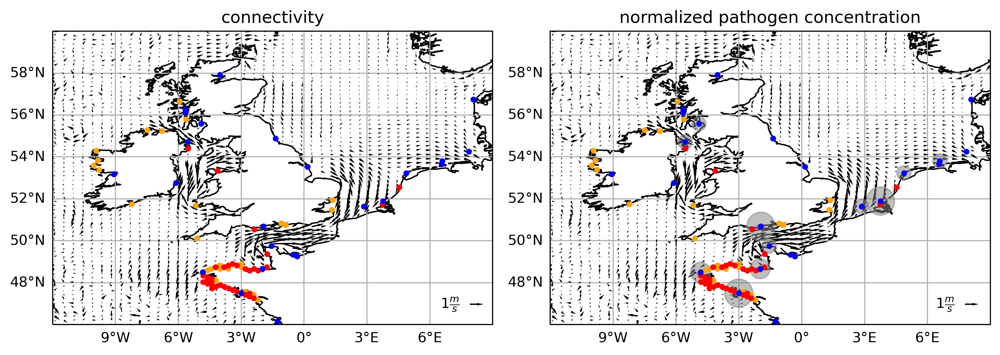

In [25]:
#01.07.2021 version for Arne & Julia

# 01.07.2021 
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots(
    1, 2,
    # subplot_kw={"projection": cartopy.crs.Stereographic(
    #     central_longitude=ds_conn.hex_proj__lon_origin,
    #     central_latitude=ds_conn.hex_proj__lat_origin,
    # )},
    subplot_kw={"projection": cartopy.crs.PlateCarree()},
    figsize=(10, 6.26),
)

fig.set_dpi(300)

ax[0].coastlines(zorder=0)
ax[1].coastlines(zorder=0)

ax[0].set_title("connectivity")
ax[0].set_extent([-12, 9, 46, 60])
gl0 = ax[0].gridlines(draw_labels=True, zorder=0)
gl0.top_labels=False   # suppress top labels
gl0.right_labels=False # suppress right labels;

ax[1].set_title("normalized pathogen concentration")
ax[1].set_extent([-12, 9, 46, 60])
gl1 = ax[1].gridlines(draw_labels=True, zorder=0);
gl1.top_labels=False   # suppress top labels
gl1.right_labels=False # suppress right labels;

#add current velocity and direction vectors

u = subset_day.uo.squeeze()
v = subset_day.vo.squeeze()

# Adjust the length and width of the arrows based on intensity
#scale_factor = 0.1  # Adjust this factor to control the arrow size
#u_scaled = u * scale_factor
#v_scaled = v * scale_factor

lon, lat = np.meshgrid(subset.lon.values, subset.lat.values)

# Define a slice to skip drawing some of the quiver arrows to reduce clutter
skip = (slice(None, None, 15), slice(None, None, 15))

# Use the quiver function to display current vectors with their direction and intensity
#fig.quiver(lon[skip], lat[skip], u_scaled[skip], v_scaled[skip], color='black', latlon=True, scale=2, width=0.003, headwidth=4)

q1 = ax[0].quiver(lon[skip], lat[skip], u[skip], v[skip], color='black', width=0.003, headwidth=2)
q2 = ax[1].quiver(lon[skip], lat[skip], u[skip], v[skip], color='black', width=0.003, headwidth=2)

_dss_to_rst_stats = dss_to_rst_stats.copy()

_dss_to_rst_stats["rel_num_dss_sources_category"] *= 100
_dss_to_rst_stats["rel_pathogen_concentration_category"] *= 100

_dss_to_rst_stats.plot.scatter(
    x="lon", y="lat", s="rel_pathogen_concentration_category",
    alpha=0.5, color="gray",
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", zorder=1,
    ax=ax[0], transform=cartopy.crs.PlateCarree()
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] == 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="orange",zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

dss_origins_01y.where(dss_origins_01y["obs_per_origin_area"] > 0).plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, color="red", zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree(),
)

known_rst_sites.plot.scatter(
    x="lon_hex0", y="lat_hex0", s=10, 
    color="blue", zorder=1,
    ax=ax[1], transform=cartopy.crs.PlateCarree()
)

# Add quiver keys to each subplot with a valid labelpos
ax[0].quiverkey(q1, 0.47, 0.3, 1, r'$1 \frac{m}{s}$', labelpos='W', coordinates='figure')
ax[1].quiverkey(q2, 0.96 , 0.3, 1, r'$1 \frac{m}{s}$', labelpos='W', coordinates='figure')


#fig.patch.set_alpha(0.7)

fig.tight_layout();

fig.savefig("plots/041_rest-sites_risk-analsysis_velocity_01july2021_OHmeeting.pdf")